In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from IPython.display import display
import iDEA
import pickle
from scipy.integrate import simpson
from pathlib import Path
import multiplet_classes

l = 5
points = 500
x = np.linspace(0, l, points)
dx = x[1] - x[0]
v_ext = np.zeros(len(x))
v_int = np.zeros([len(x), len(x)])
pib_double = iDEA.system.System(x, v_ext, v_int, electrons = "ud")
states = {}

directory = Path("states")

for i in range(100, 200):
    file_path = directory / f"energy_comp_state_{i}.pkl"
    try:
        with file_path.open("rb") as file:
            states[i] = pickle.load(file)
    except FileNotFoundError:
        print(f"File state_{i}.pkl not found.")
    except Exception as e:
        print(f"An error occurred while loading state_{i}.pkl: {e}")

with open("result_200.pkl", "rb") as file:
    index_list = pickle.load(file)

In [2]:
import os

def wave_function(l, n, X):
    return np.sqrt(2/l) * np.sin((np.pi) * X * (n+1) / l)

def states_density_comparison(states: dict, s: iDEA.system.System, l, points):
    # Initialize system
    x = s.x
    x_prime = x
    dx = s.dx
    y = np.linspace(-dx, l+dx, points+2)

    orbital_space = []
    analytic_space_1 = []
    analytic_space_2 = []

    for key, value in states.items():
        n = iDEA.observables.density(s, value)

        index_k = index_list.up_indices[key]
        index_j = index_list.down_indices[key]
        # integrand_1 = (np.abs(wave_function(l, index_j, x_prime))) ** 2
        # integral = simpson(integrand_1, x=x_prime)

        # many_body = np.sqrt(1/2) * (wave_function(l, index_k, x)*wave_function(l, index_j, x) + wave_function(l, index_k, x_prime)*wave_function(l, index_j, x_prime))
        # integrand_2 = np.abs(many_body)**2
        # integral = simpson(integrand_2, x=x_prime)
        # pd_analytic_1 = abs(wave_function(l, state_index_list[key][0], x) * wave_function(l, state_index_list[key][1], x)) ** 2

        # print(integral)

        pd_analytic_1 = (np.abs(wave_function(l, index_k, x)))**2 + (np.abs(wave_function(l, index_j, x)))**2
        pd_analytic_2 = abs(wave_function((l+2*dx), index_k, y) * wave_function((l+2*dx), index_j, y)) ** 2
        pd_analytic_2 = pd_analytic_2[1:-1]
        
        orbital_space.append(n)
        analytic_space_1.append(pd_analytic_1)
        analytic_space_2.append(pd_analytic_2)

        # Ensure the directory for saving images exists
        output_dir = 'frames'
        if not os.path.exists(output_dir):
            os.makedirs(output_dir)
    # Define the function to plot the array
    def plot_array(k):
        plt.figure(figsize=(10, 6))
        plt.plot(x, orbital_space[k], "black")
        plt.plot(x, analytic_space_1[k], "b--")
        plt.title(f'State {k+100}')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.grid(True)
        plt.legend(["Approximate prob. density", "Analytical prob. density (l)"])
       
        # Check if the arrays are approximately equal
        approx_close_1 = np.allclose(orbital_space[k], analytic_space_1[k], rtol=1e-05, atol=1e-08)
        approx_close_2 = np.allclose(orbital_space[k], analytic_space_2[k], rtol=1e-05, atol=1e-08)
        
        print(f"Is approximate close to analytic 1 for state {k}?: {approx_close_1}")
        print(f"Is approximate close to analytic 2 for state {k}?: {approx_close_2}")

        plt.savefig(os.path.join(output_dir, f'fk_{k:03d}.png'))
        plt.show()
    
    for k in range(len(orbital_space)):
        plot_array(k)

    # Create a slider widget
    slider = widgets.IntSlider(value=0, min=0, max=len(orbital_space) - 1, step=1, description='k:')
    interactive_plot = widgets.interactive(plot_array, k=slider)
    
    # Display the interactive plot
    display(interactive_plot)
    # plt.plot(x, (analytic_space_2[0] - orbital_space[0]))
    # plt.show()

Is approximate close to analytic 1 for state 0?: False
Is approximate close to analytic 2 for state 0?: False


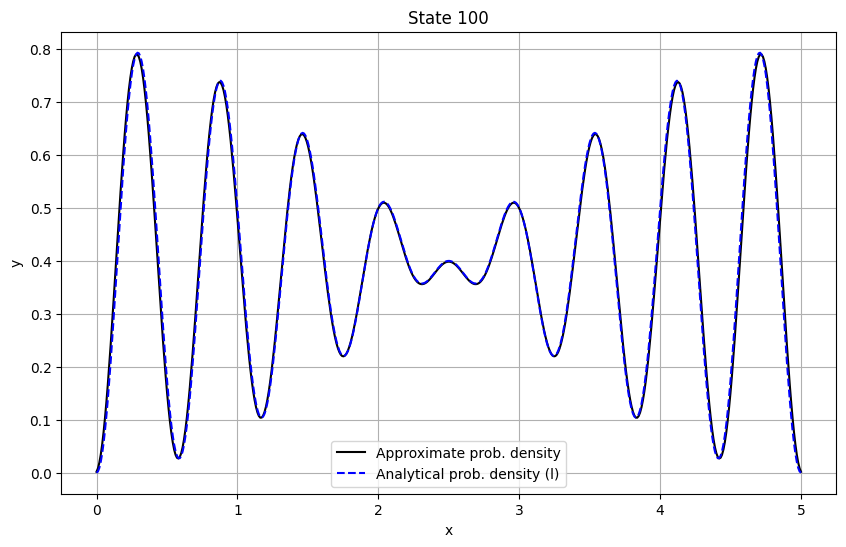

Is approximate close to analytic 1 for state 1?: False
Is approximate close to analytic 2 for state 1?: False


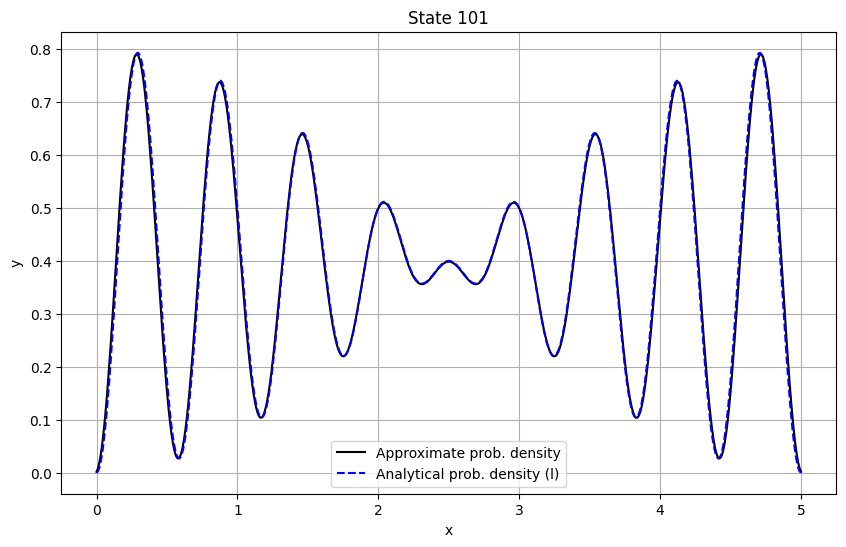

Is approximate close to analytic 1 for state 2?: False
Is approximate close to analytic 2 for state 2?: False


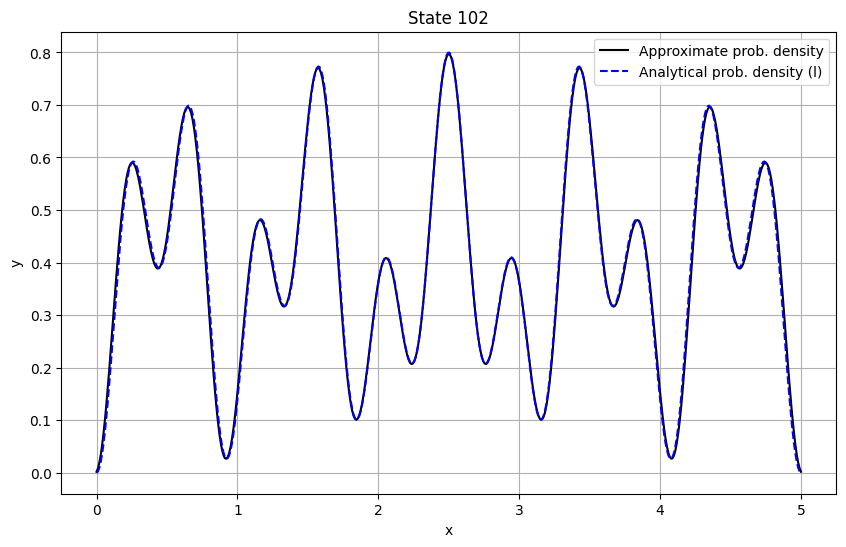

Is approximate close to analytic 1 for state 3?: False
Is approximate close to analytic 2 for state 3?: False


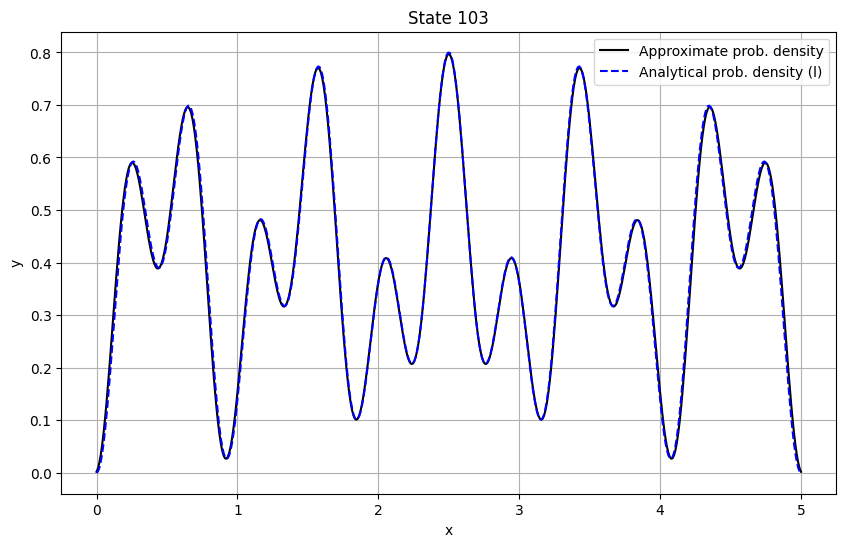

Is approximate close to analytic 1 for state 4?: False
Is approximate close to analytic 2 for state 4?: False


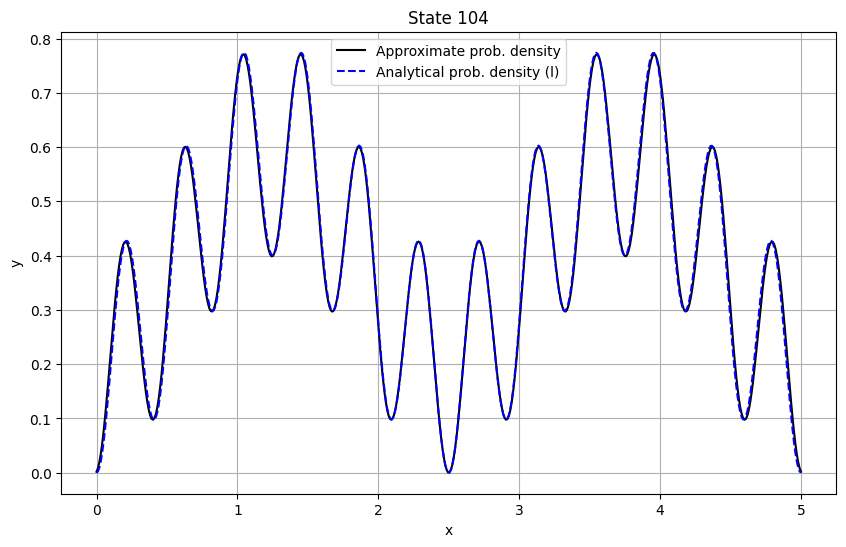

Is approximate close to analytic 1 for state 5?: False
Is approximate close to analytic 2 for state 5?: False


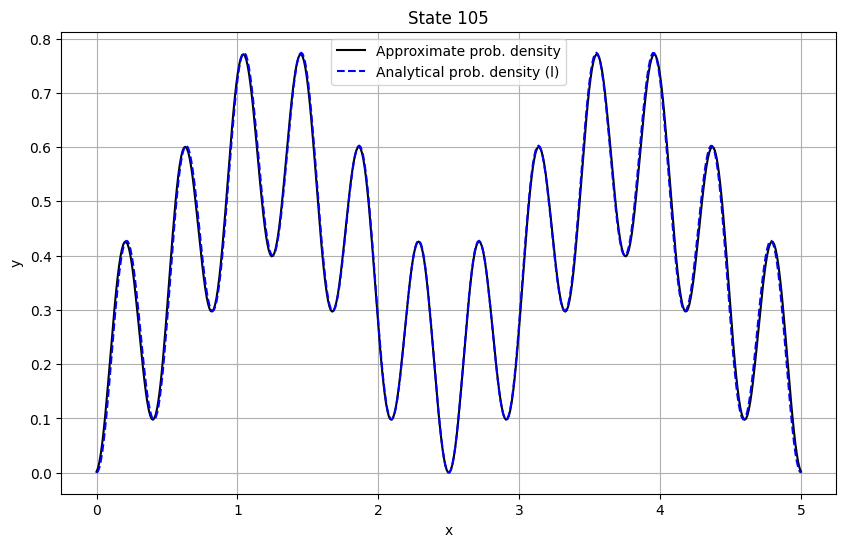

Is approximate close to analytic 1 for state 6?: False
Is approximate close to analytic 2 for state 6?: False


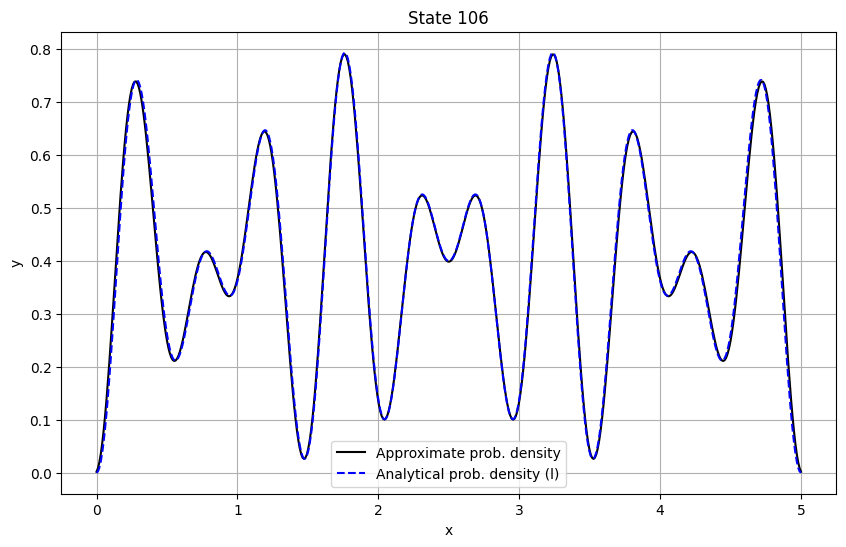

Is approximate close to analytic 1 for state 7?: False
Is approximate close to analytic 2 for state 7?: False


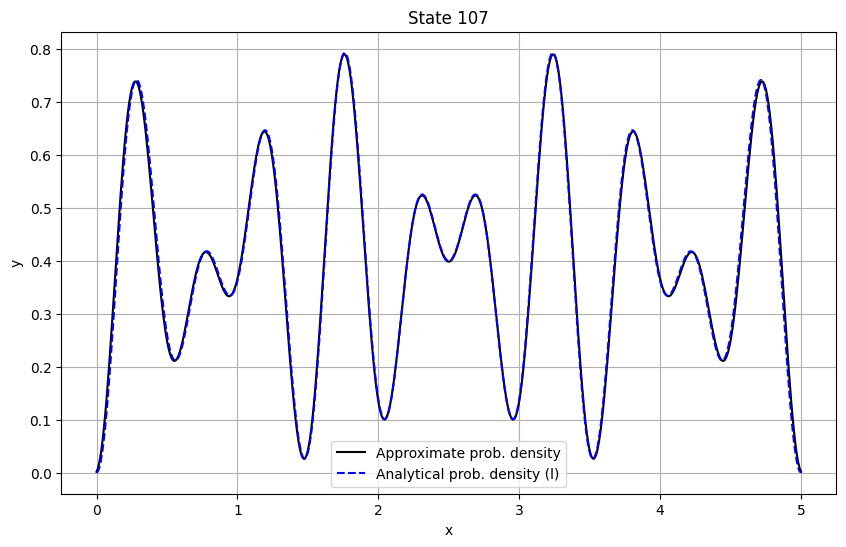

Is approximate close to analytic 1 for state 8?: False
Is approximate close to analytic 2 for state 8?: False


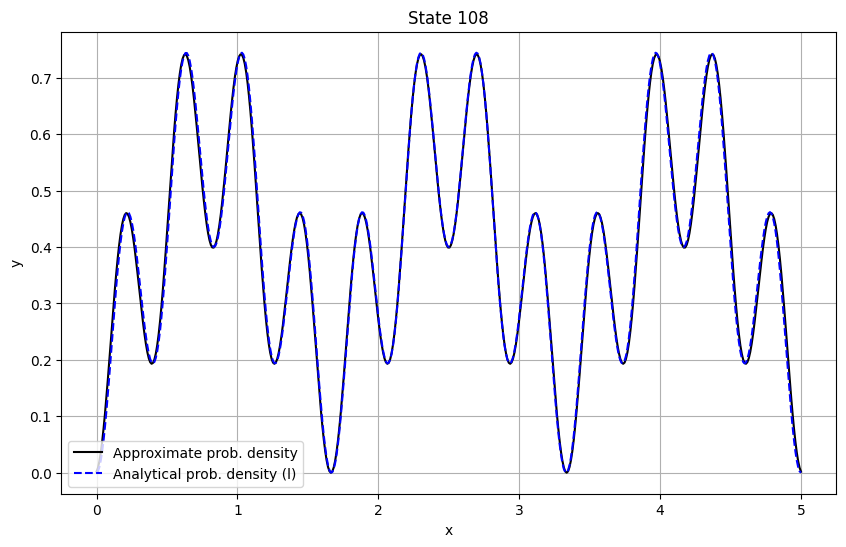

Is approximate close to analytic 1 for state 9?: False
Is approximate close to analytic 2 for state 9?: False


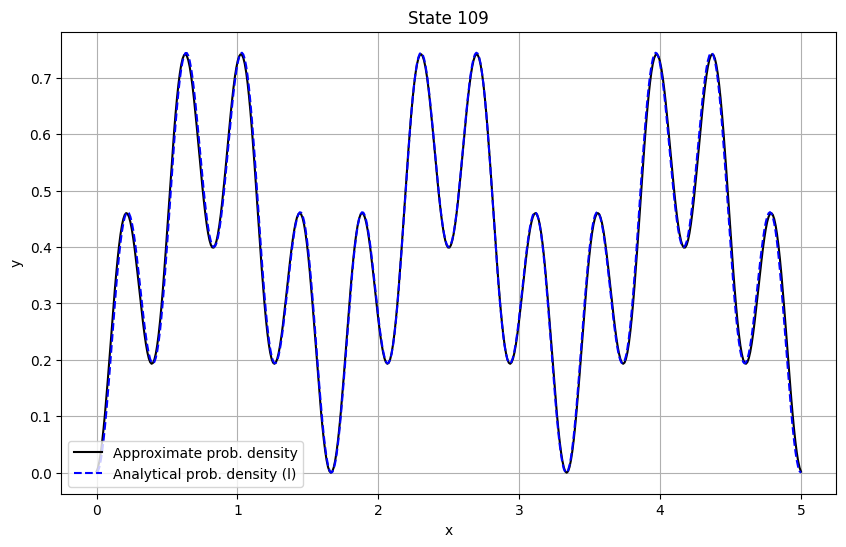

Is approximate close to analytic 1 for state 10?: False
Is approximate close to analytic 2 for state 10?: False


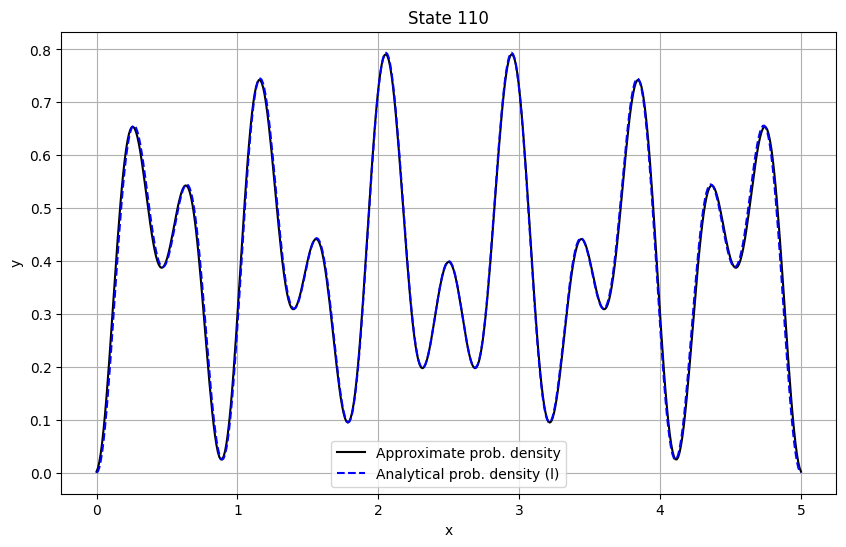

Is approximate close to analytic 1 for state 11?: False
Is approximate close to analytic 2 for state 11?: False


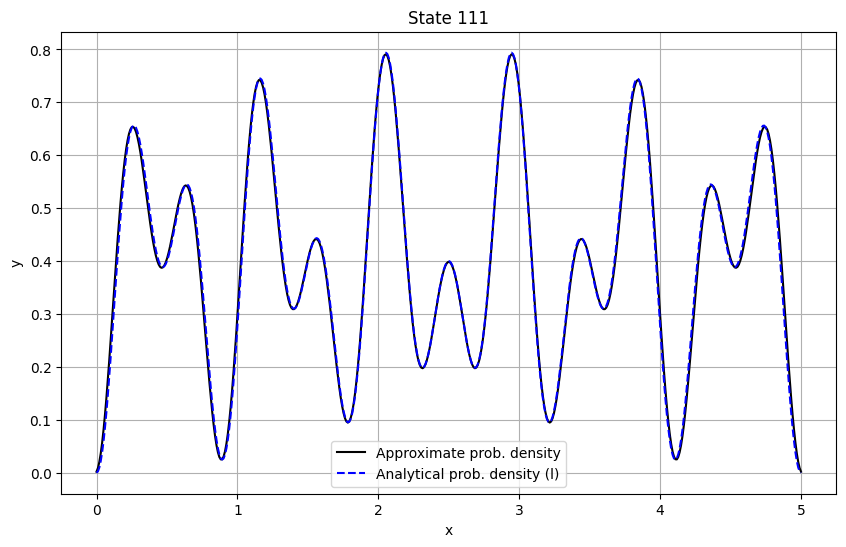

Is approximate close to analytic 1 for state 12?: False
Is approximate close to analytic 2 for state 12?: False


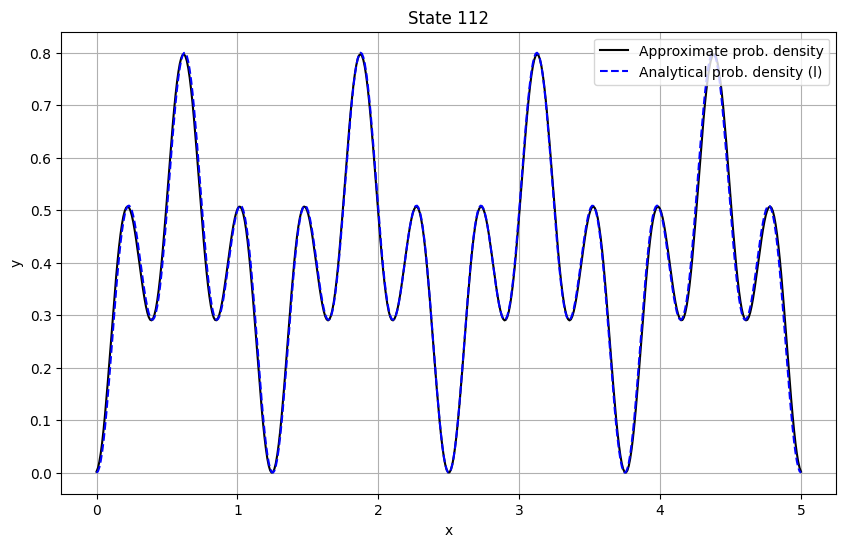

Is approximate close to analytic 1 for state 13?: False
Is approximate close to analytic 2 for state 13?: False


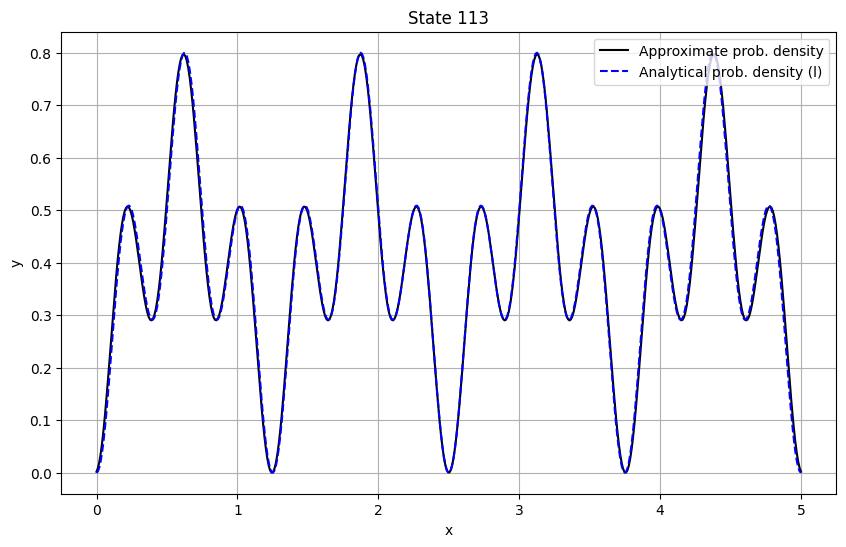

Is approximate close to analytic 1 for state 14?: False
Is approximate close to analytic 2 for state 14?: False


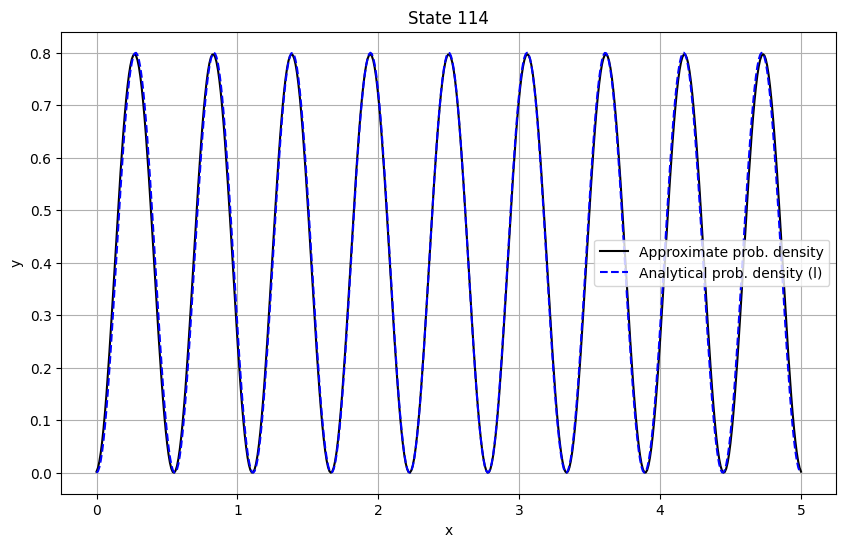

Is approximate close to analytic 1 for state 15?: False
Is approximate close to analytic 2 for state 15?: False


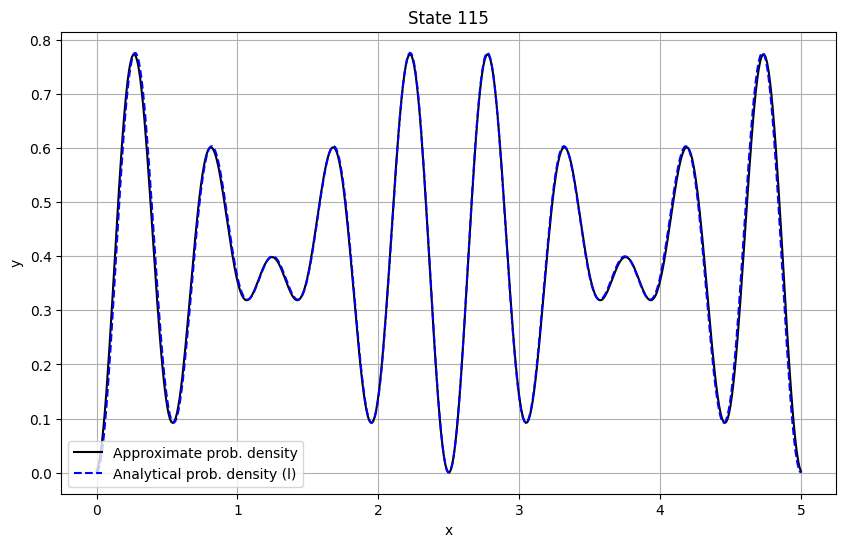

Is approximate close to analytic 1 for state 16?: False
Is approximate close to analytic 2 for state 16?: False


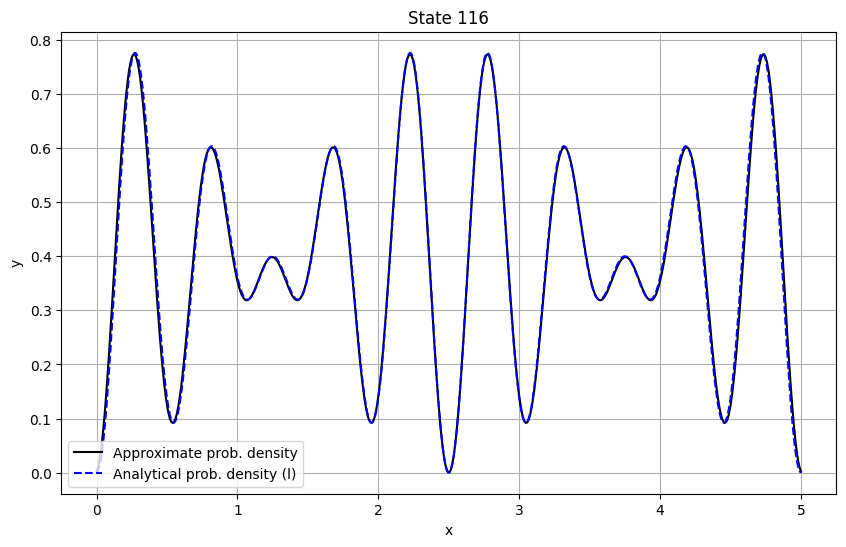

Is approximate close to analytic 1 for state 17?: False
Is approximate close to analytic 2 for state 17?: False


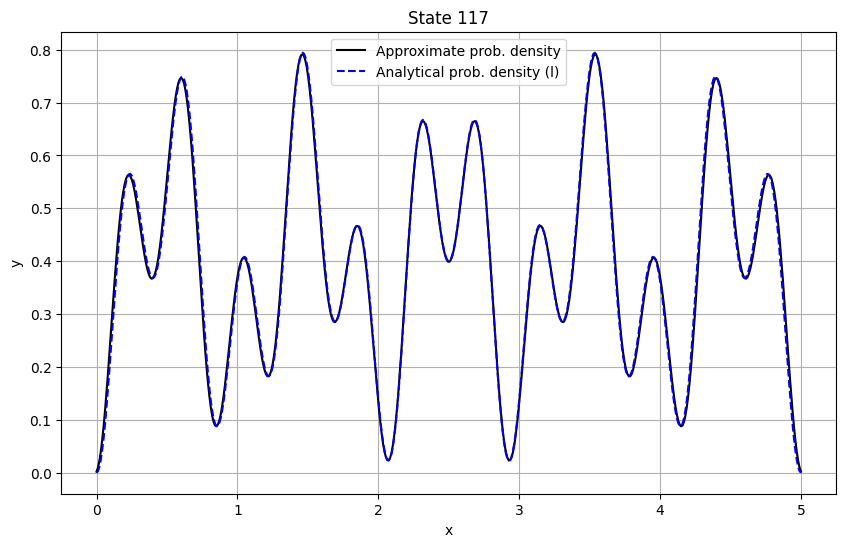

Is approximate close to analytic 1 for state 18?: False
Is approximate close to analytic 2 for state 18?: False


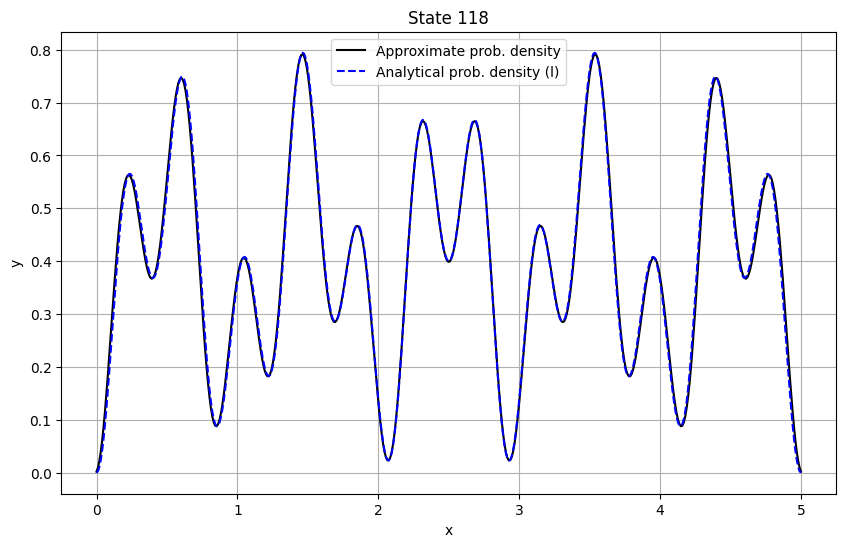

Is approximate close to analytic 1 for state 19?: False
Is approximate close to analytic 2 for state 19?: False


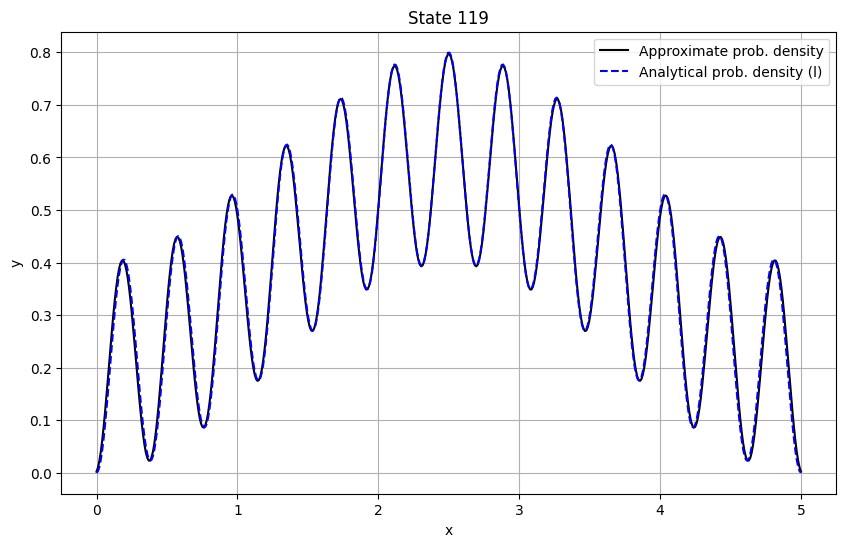

Is approximate close to analytic 1 for state 20?: False
Is approximate close to analytic 2 for state 20?: False


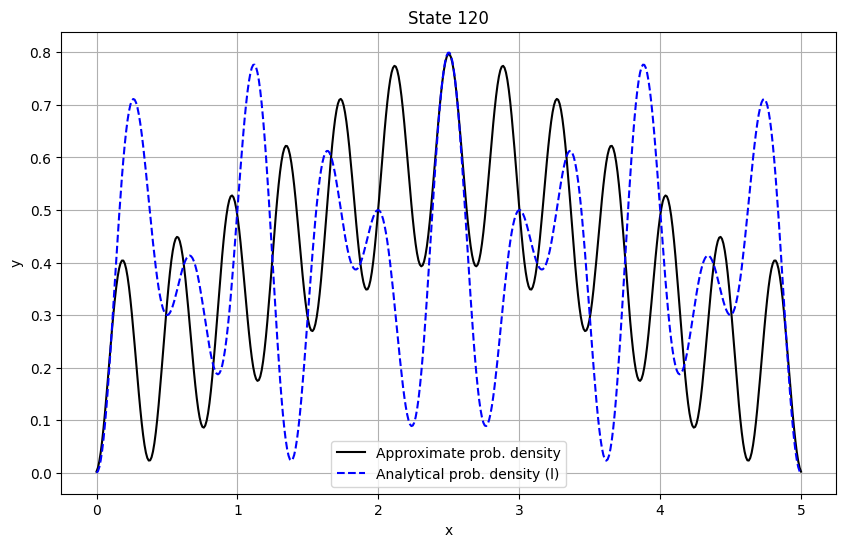

Is approximate close to analytic 1 for state 21?: False
Is approximate close to analytic 2 for state 21?: False


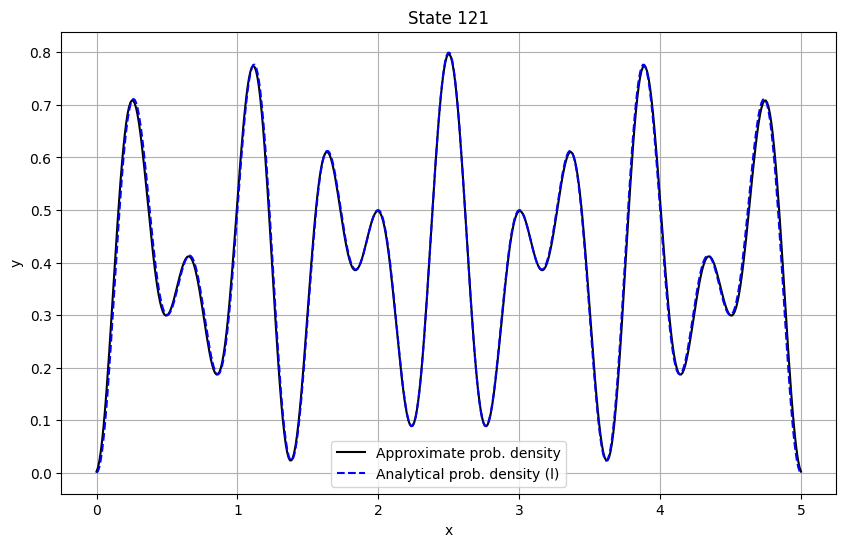

Is approximate close to analytic 1 for state 22?: False
Is approximate close to analytic 2 for state 22?: False


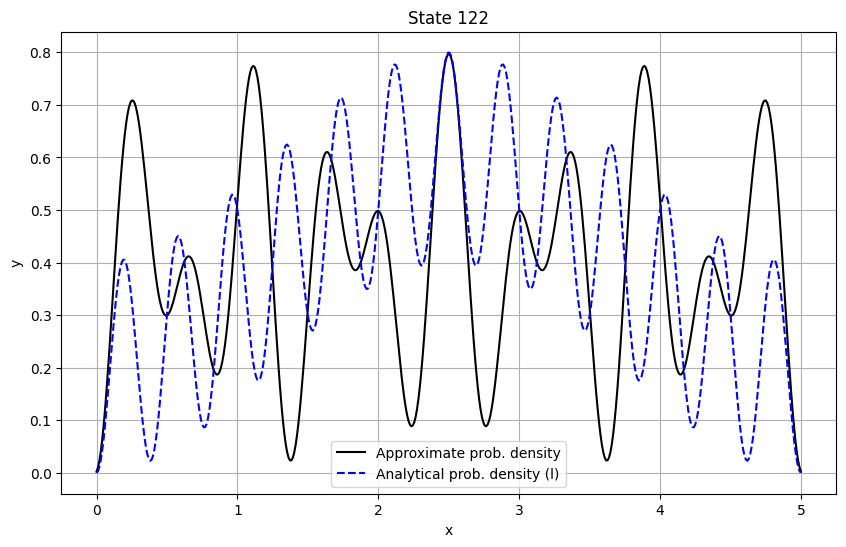

Is approximate close to analytic 1 for state 23?: False
Is approximate close to analytic 2 for state 23?: False


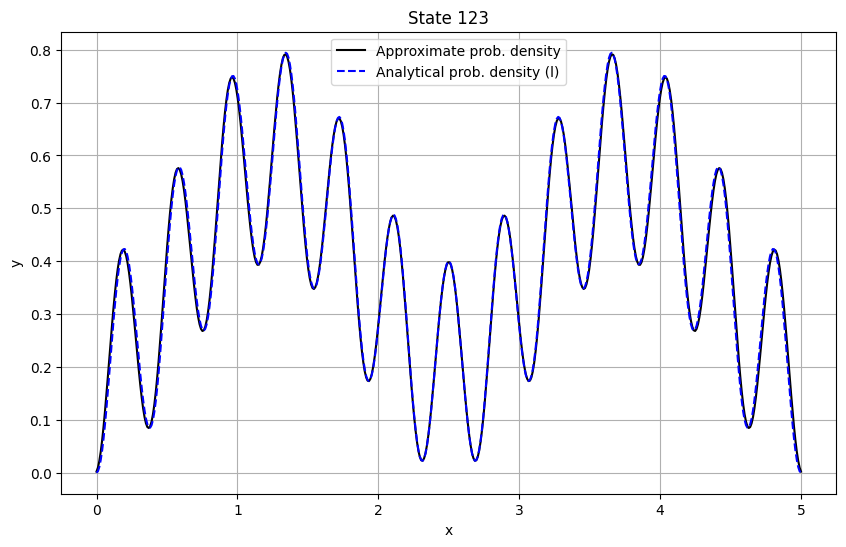

Is approximate close to analytic 1 for state 24?: False
Is approximate close to analytic 2 for state 24?: False


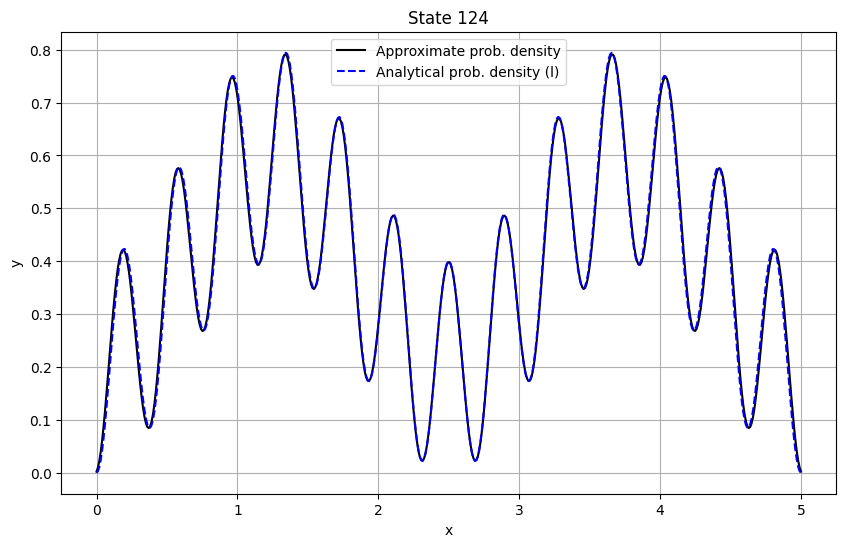

Is approximate close to analytic 1 for state 25?: False
Is approximate close to analytic 2 for state 25?: False


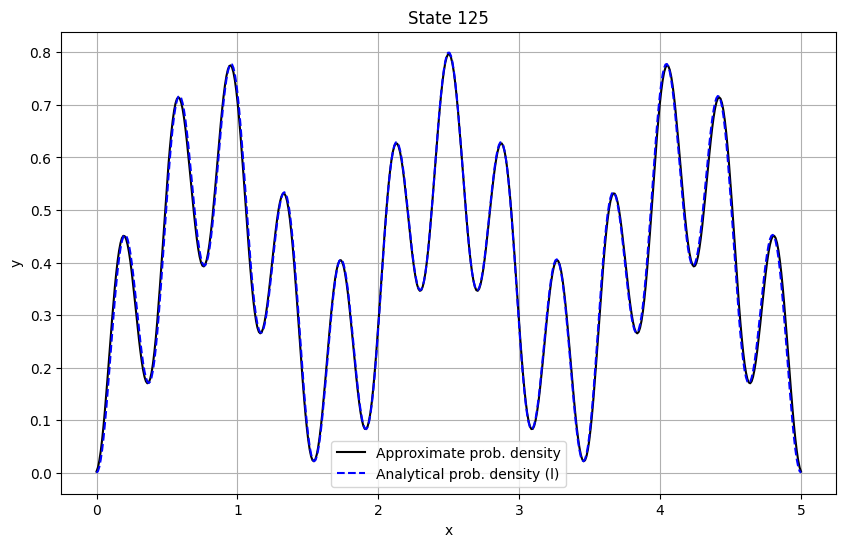

Is approximate close to analytic 1 for state 26?: False
Is approximate close to analytic 2 for state 26?: False


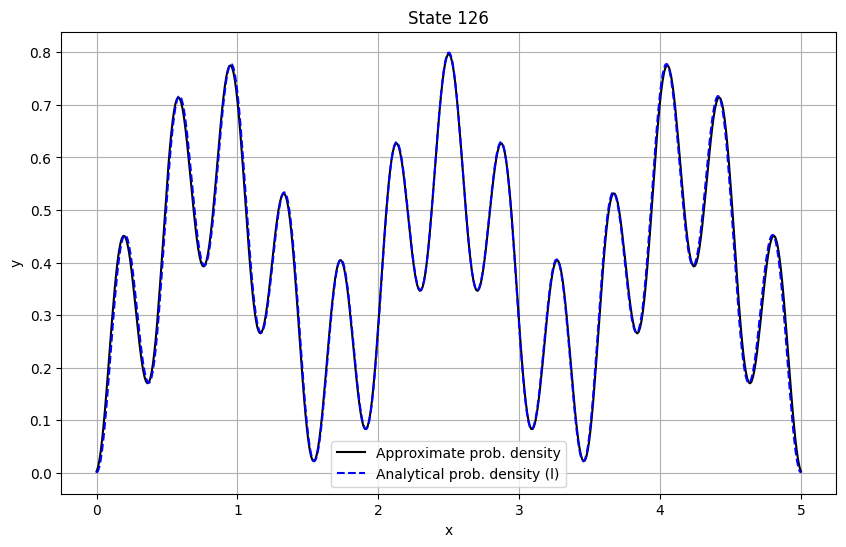

Is approximate close to analytic 1 for state 27?: False
Is approximate close to analytic 2 for state 27?: False


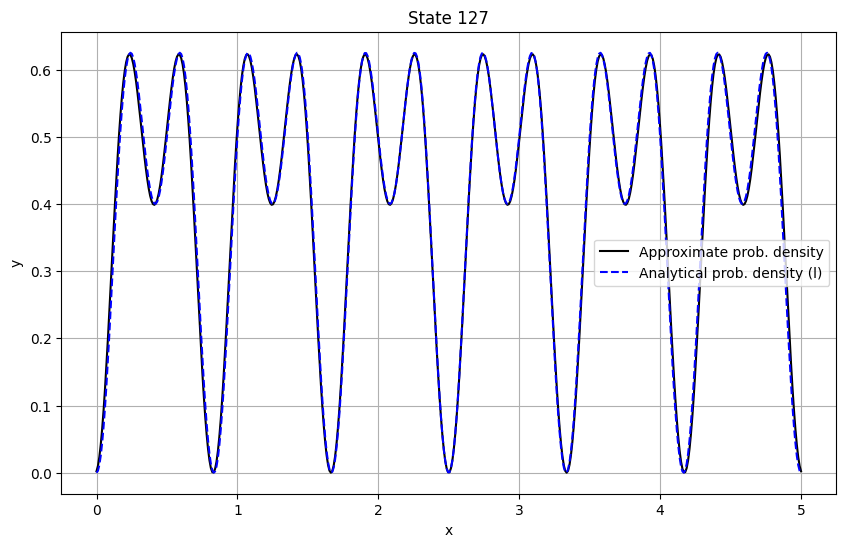

Is approximate close to analytic 1 for state 28?: False
Is approximate close to analytic 2 for state 28?: False


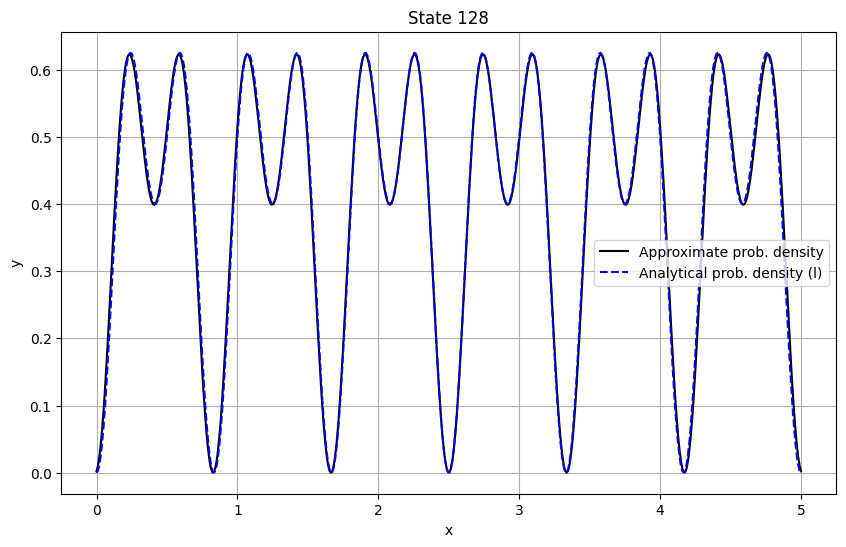

Is approximate close to analytic 1 for state 29?: False
Is approximate close to analytic 2 for state 29?: False


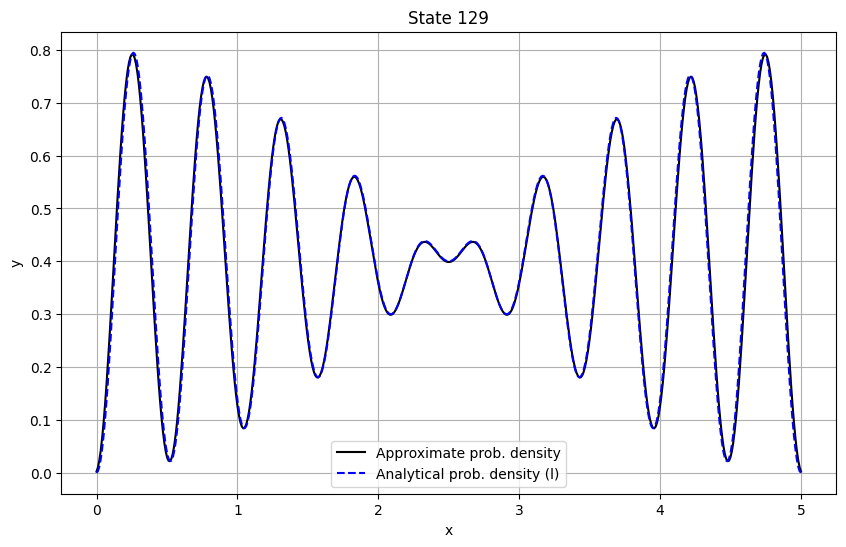

Is approximate close to analytic 1 for state 30?: False
Is approximate close to analytic 2 for state 30?: False


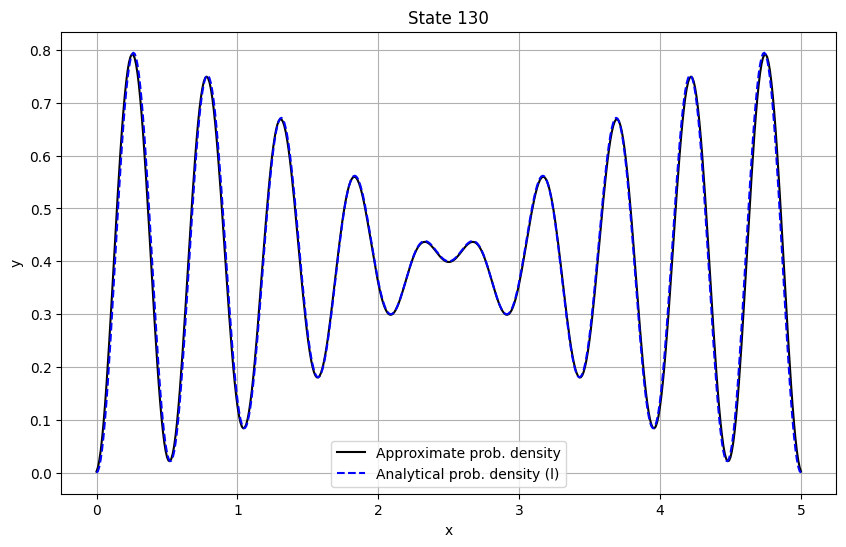

Is approximate close to analytic 1 for state 31?: False
Is approximate close to analytic 2 for state 31?: False


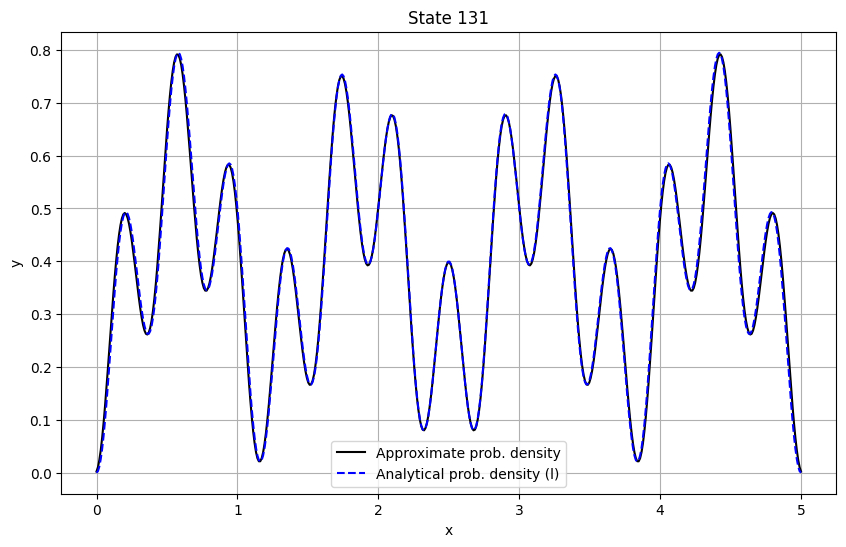

Is approximate close to analytic 1 for state 32?: False
Is approximate close to analytic 2 for state 32?: False


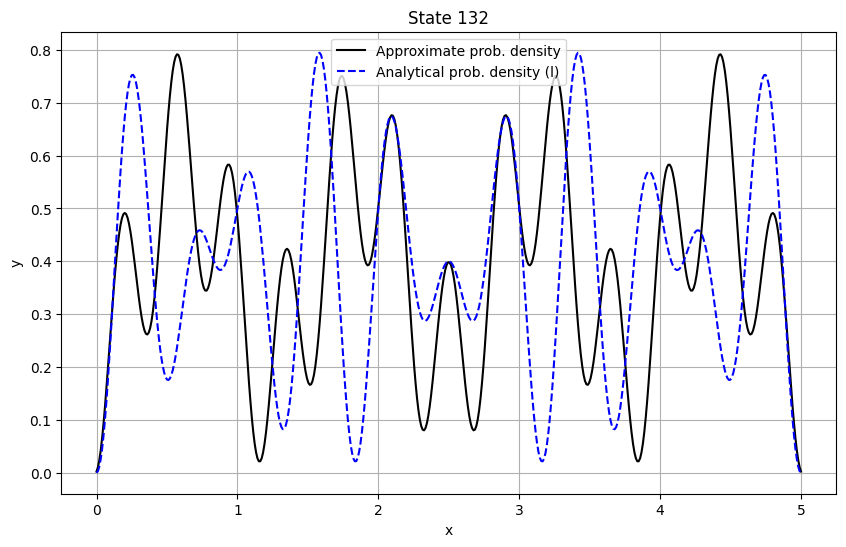

Is approximate close to analytic 1 for state 33?: False
Is approximate close to analytic 2 for state 33?: False


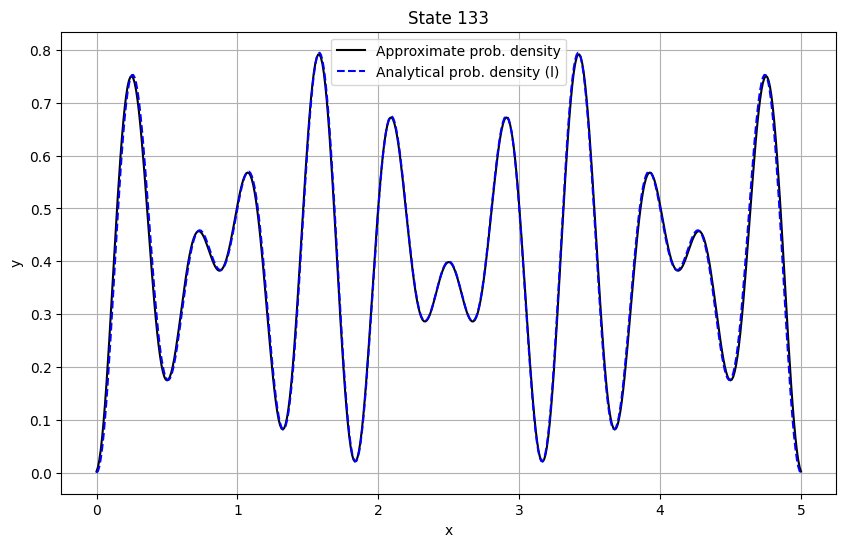

Is approximate close to analytic 1 for state 34?: False
Is approximate close to analytic 2 for state 34?: False


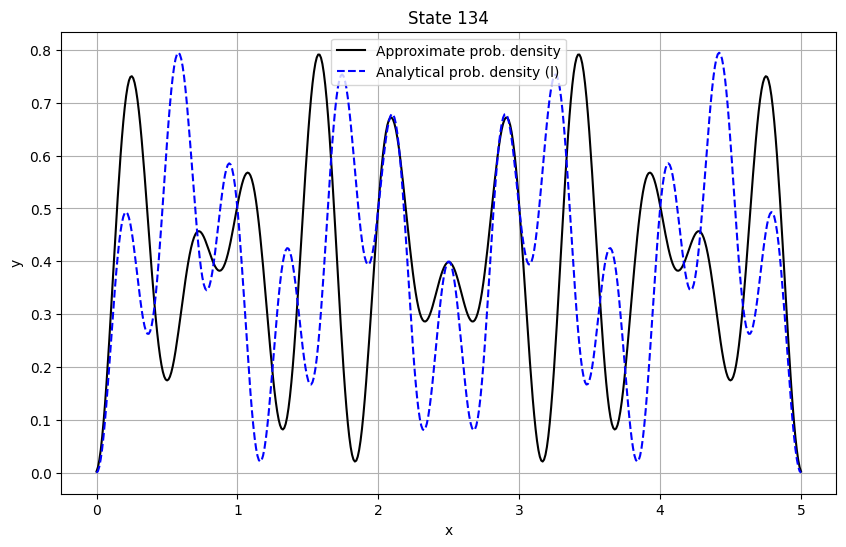

Is approximate close to analytic 1 for state 35?: False
Is approximate close to analytic 2 for state 35?: False


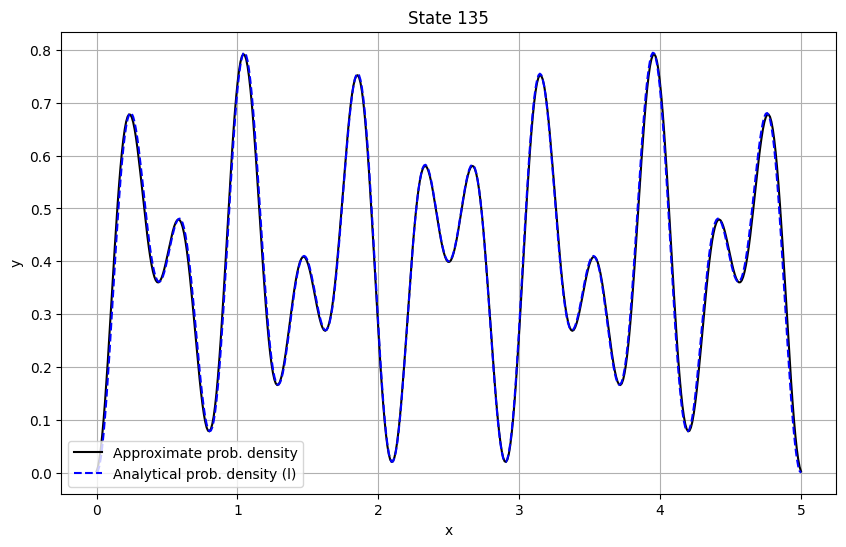

Is approximate close to analytic 1 for state 36?: False
Is approximate close to analytic 2 for state 36?: False


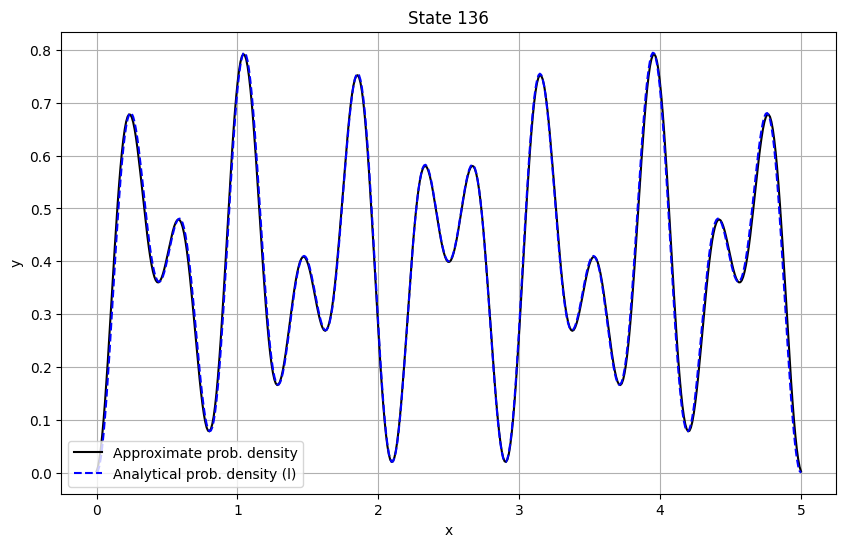

Is approximate close to analytic 1 for state 37?: False
Is approximate close to analytic 2 for state 37?: False


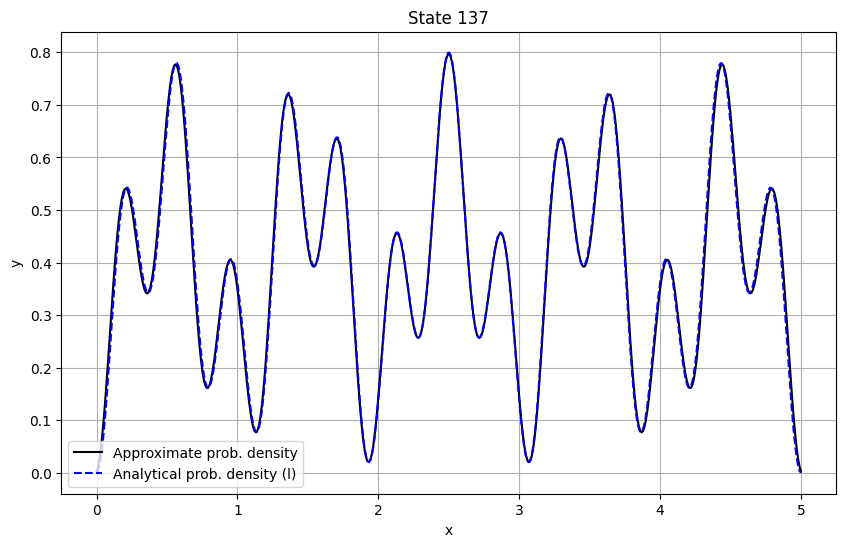

Is approximate close to analytic 1 for state 38?: False
Is approximate close to analytic 2 for state 38?: False


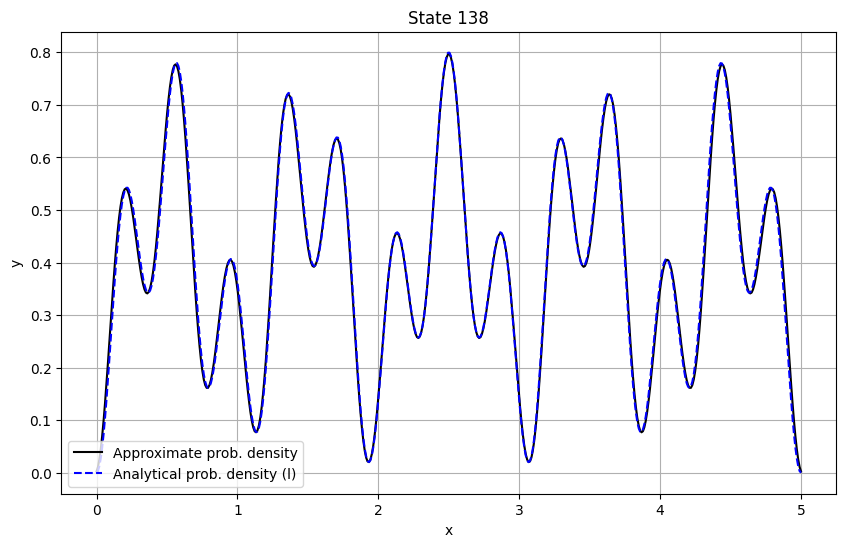

Is approximate close to analytic 1 for state 39?: False
Is approximate close to analytic 2 for state 39?: False


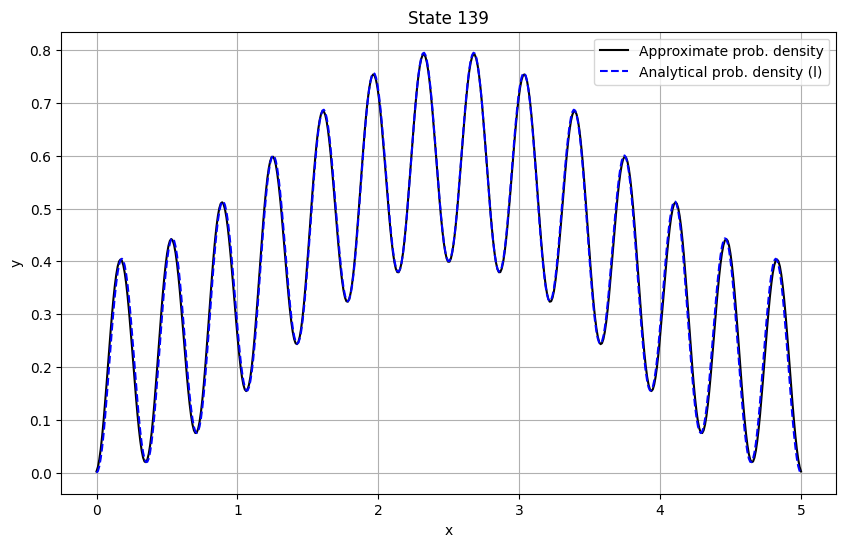

Is approximate close to analytic 1 for state 40?: False
Is approximate close to analytic 2 for state 40?: False


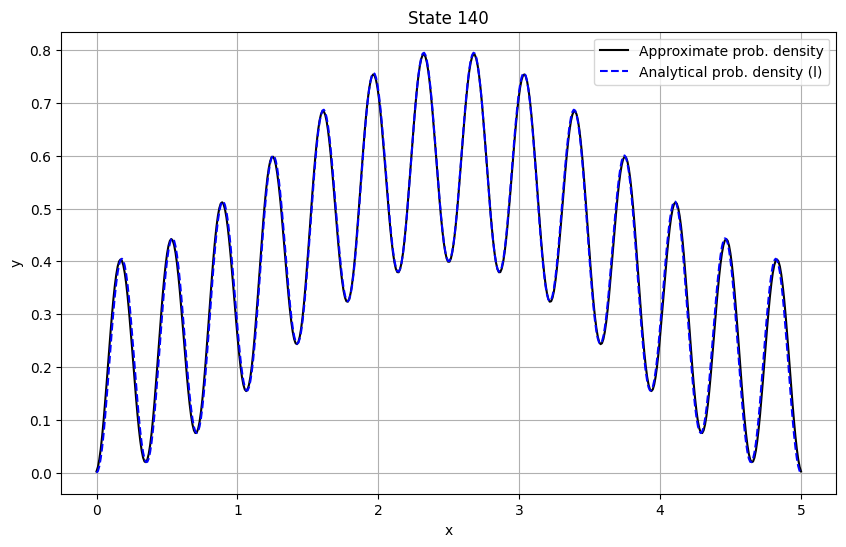

Is approximate close to analytic 1 for state 41?: False
Is approximate close to analytic 2 for state 41?: False


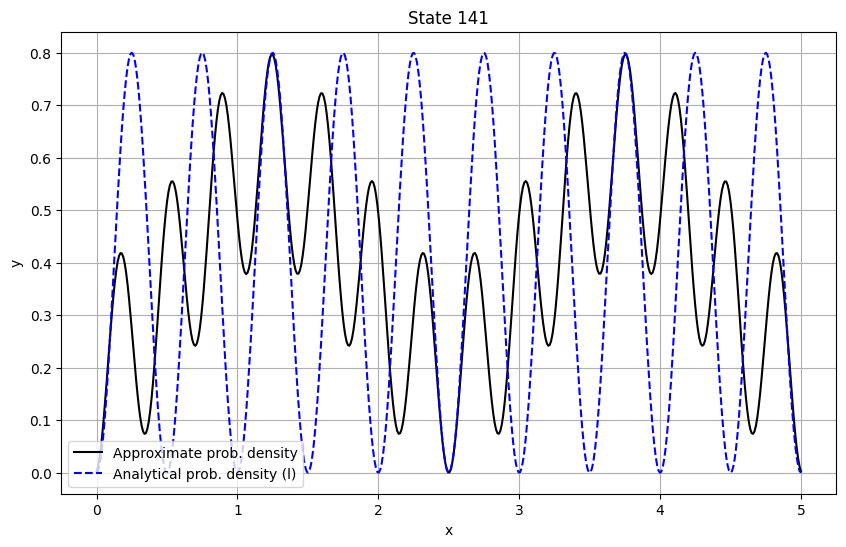

Is approximate close to analytic 1 for state 42?: False
Is approximate close to analytic 2 for state 42?: False


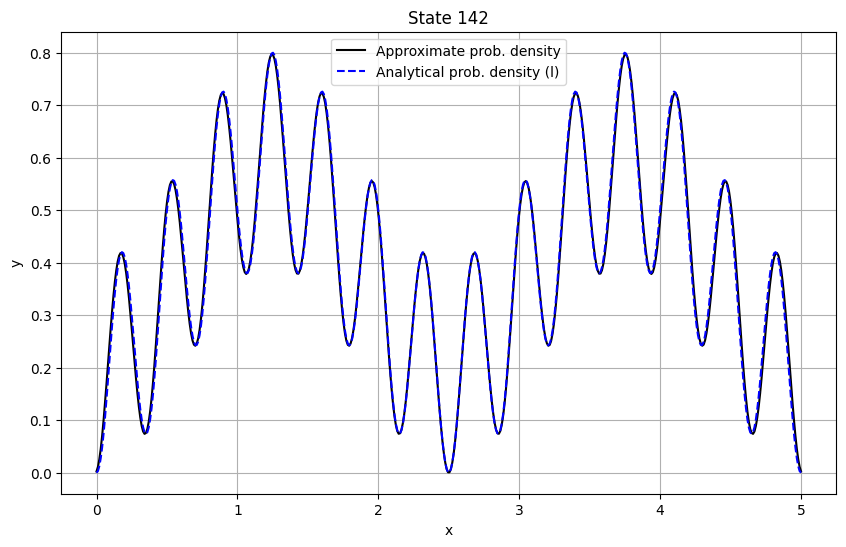

Is approximate close to analytic 1 for state 43?: False
Is approximate close to analytic 2 for state 43?: False


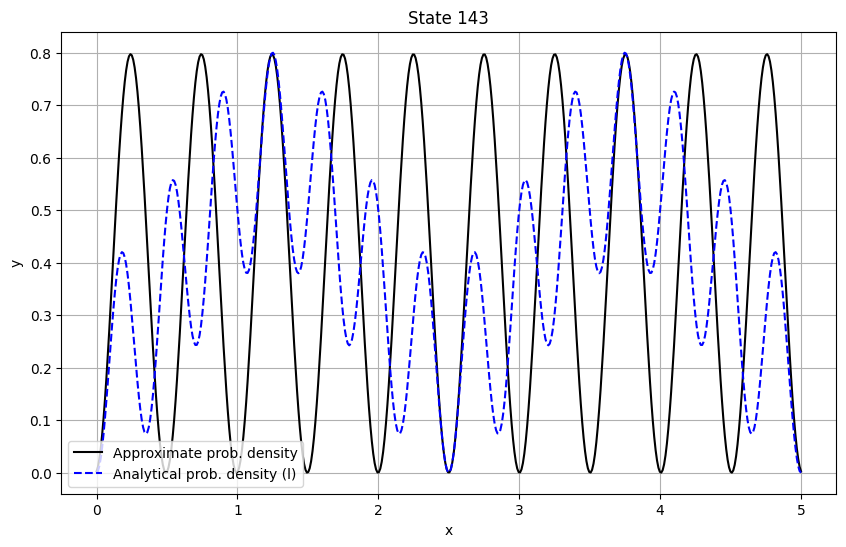

Is approximate close to analytic 1 for state 44?: False
Is approximate close to analytic 2 for state 44?: False


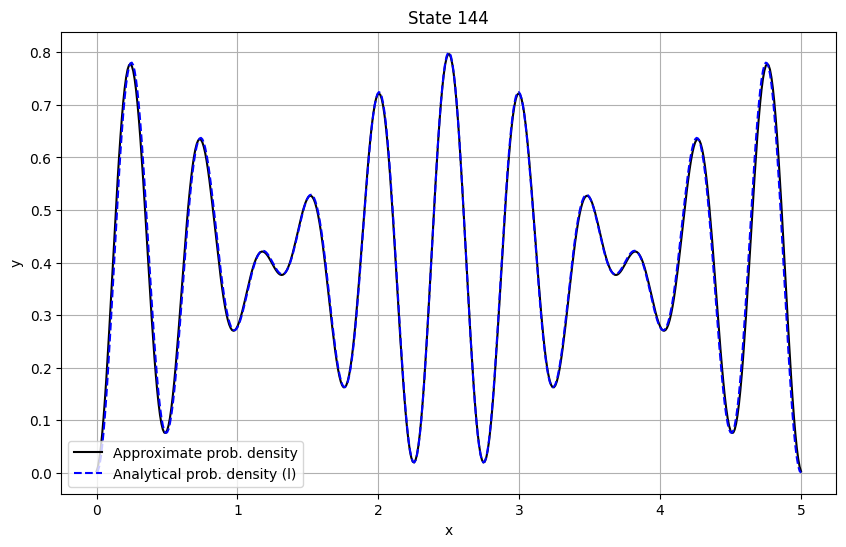

Is approximate close to analytic 1 for state 45?: False
Is approximate close to analytic 2 for state 45?: False


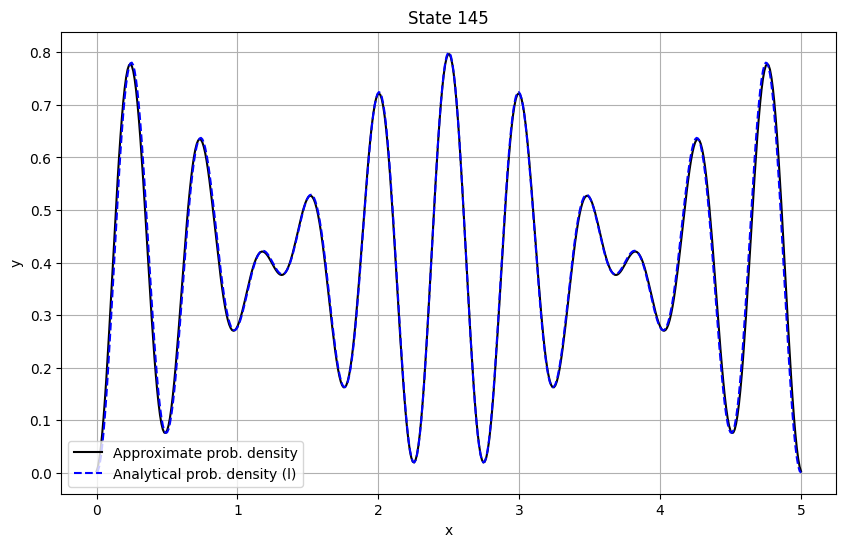

Is approximate close to analytic 1 for state 46?: False
Is approximate close to analytic 2 for state 46?: False


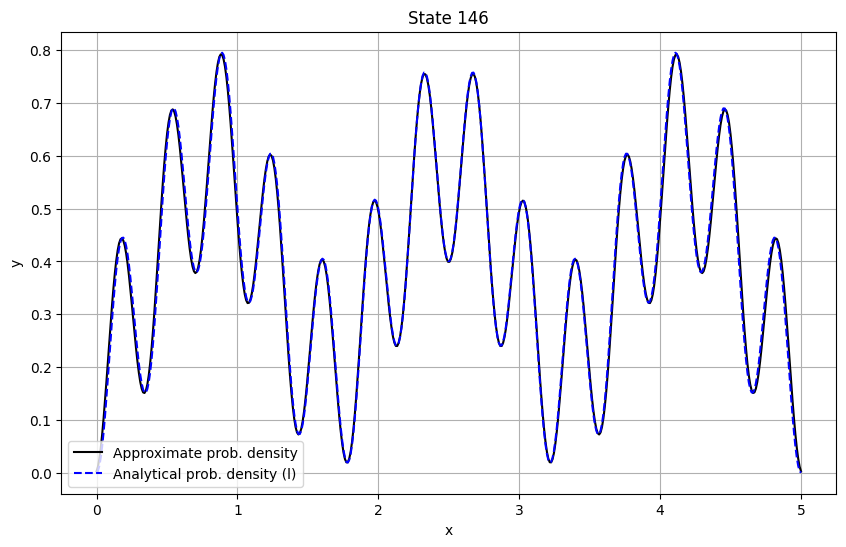

Is approximate close to analytic 1 for state 47?: False
Is approximate close to analytic 2 for state 47?: False


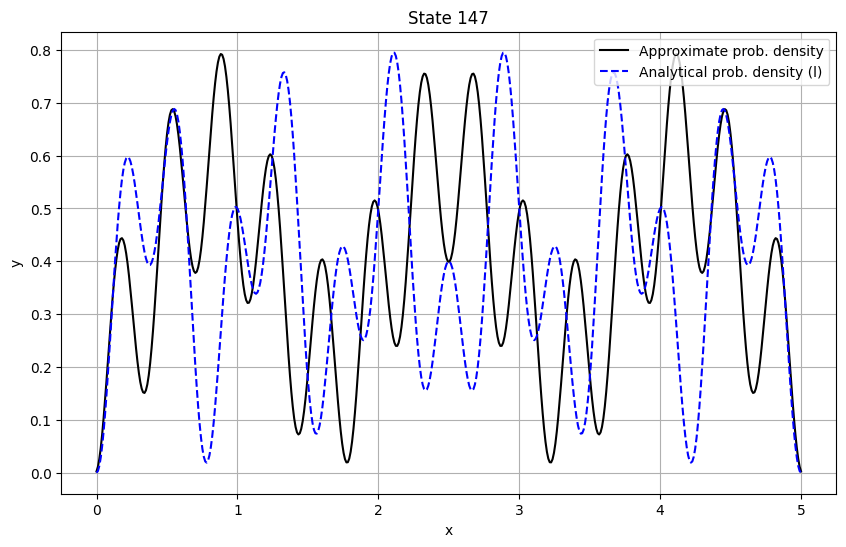

Is approximate close to analytic 1 for state 48?: False
Is approximate close to analytic 2 for state 48?: False


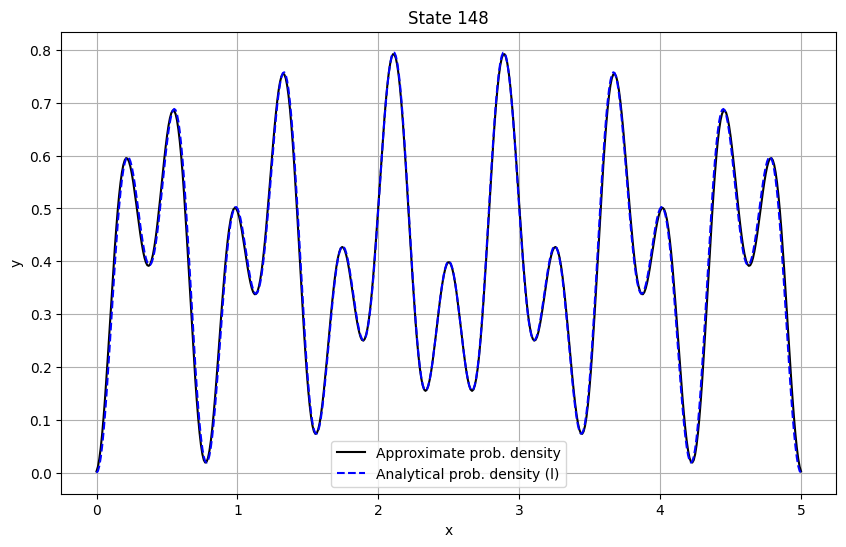

Is approximate close to analytic 1 for state 49?: False
Is approximate close to analytic 2 for state 49?: False


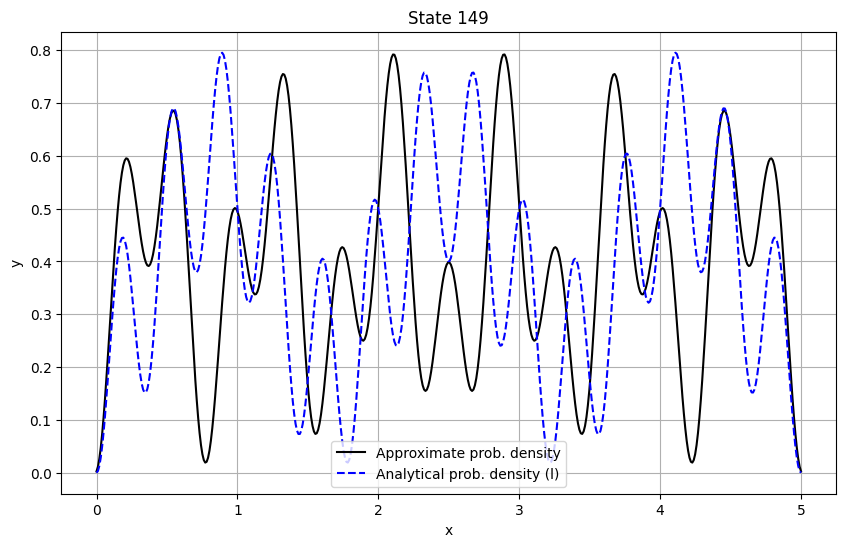

Is approximate close to analytic 1 for state 50?: False
Is approximate close to analytic 2 for state 50?: False


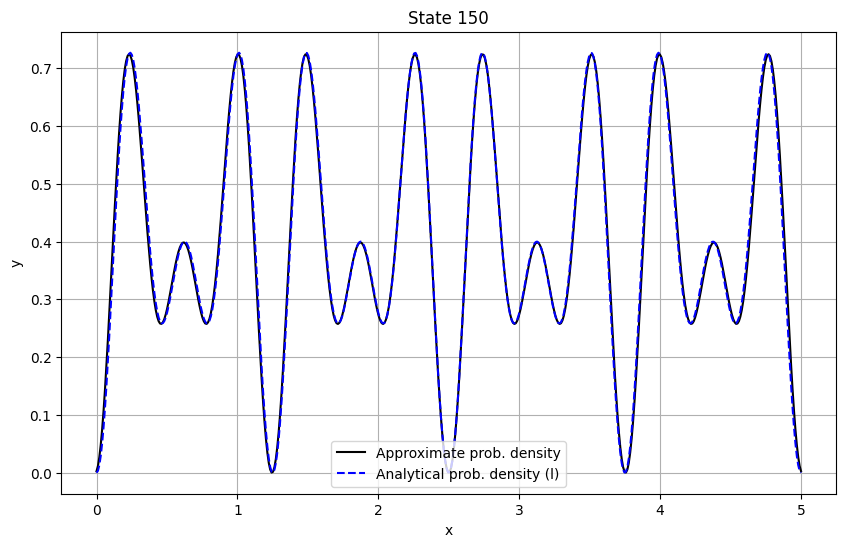

Is approximate close to analytic 1 for state 51?: False
Is approximate close to analytic 2 for state 51?: False


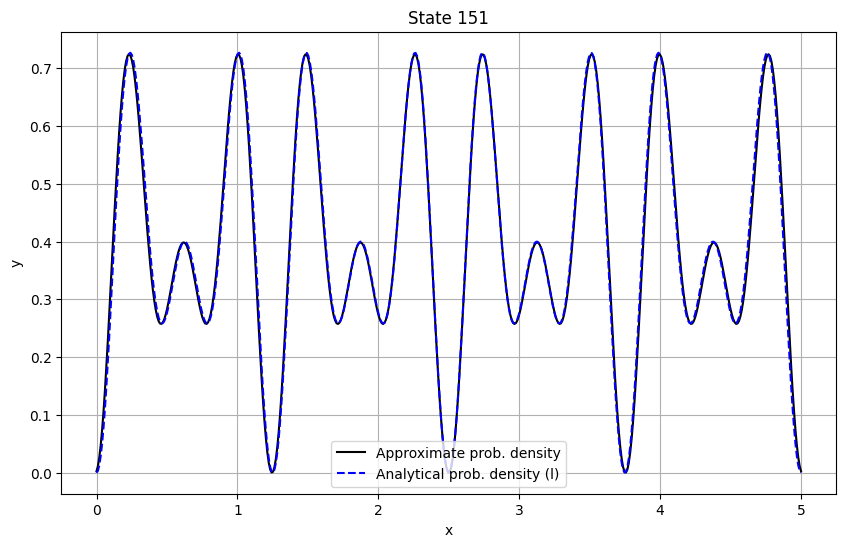

Is approximate close to analytic 1 for state 52?: False
Is approximate close to analytic 2 for state 52?: False


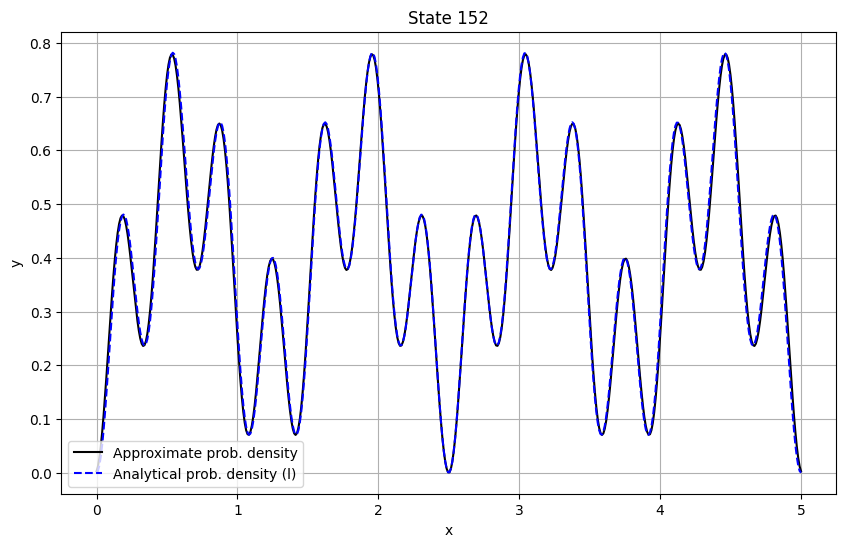

Is approximate close to analytic 1 for state 53?: False
Is approximate close to analytic 2 for state 53?: False


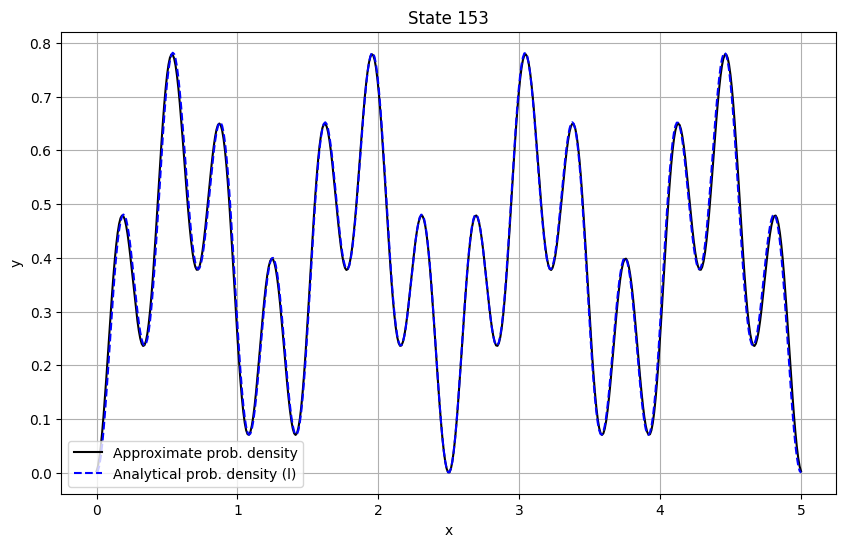

Is approximate close to analytic 1 for state 54?: False
Is approximate close to analytic 2 for state 54?: False


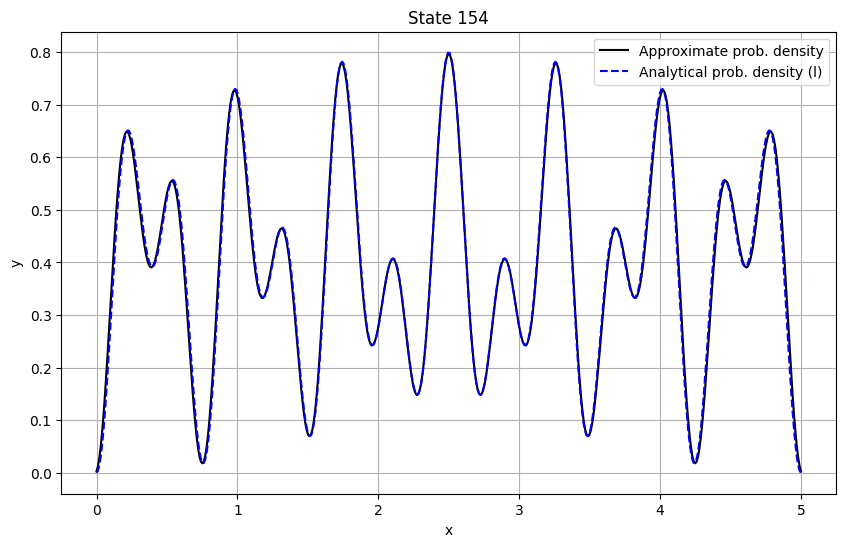

Is approximate close to analytic 1 for state 55?: False
Is approximate close to analytic 2 for state 55?: False


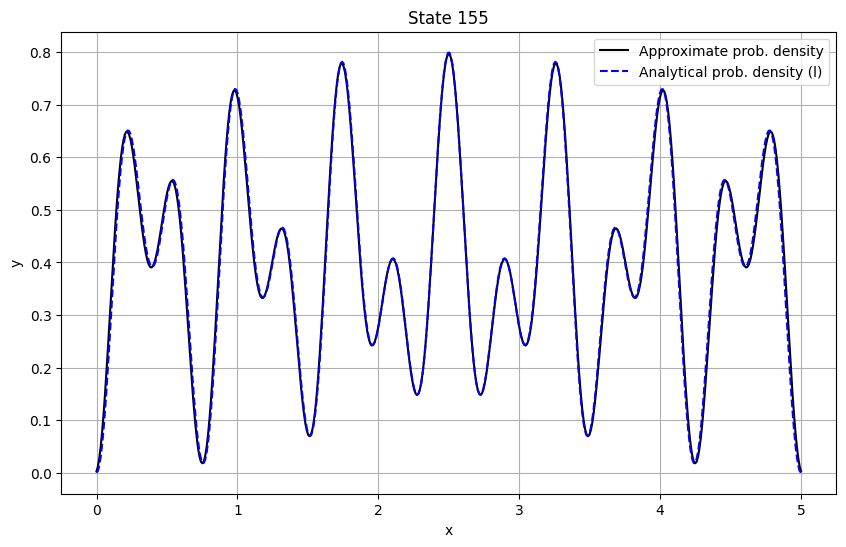

Is approximate close to analytic 1 for state 56?: False
Is approximate close to analytic 2 for state 56?: False


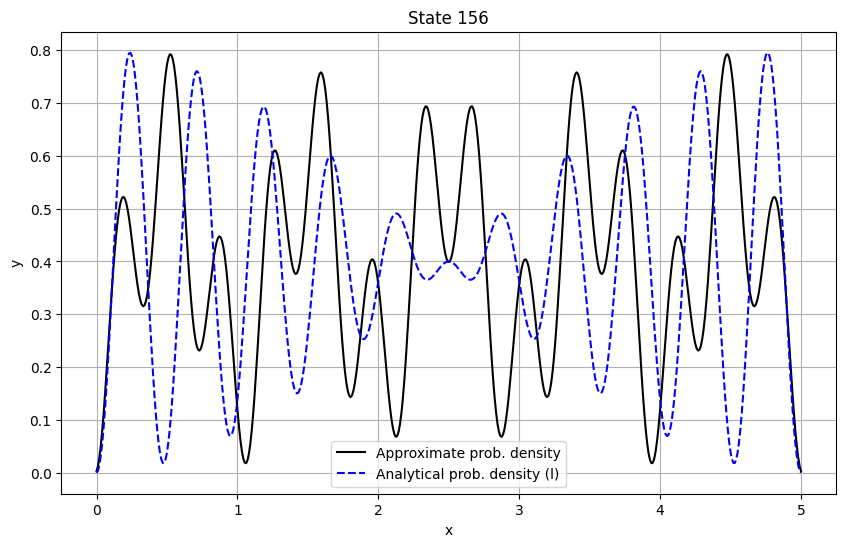

Is approximate close to analytic 1 for state 57?: False
Is approximate close to analytic 2 for state 57?: False


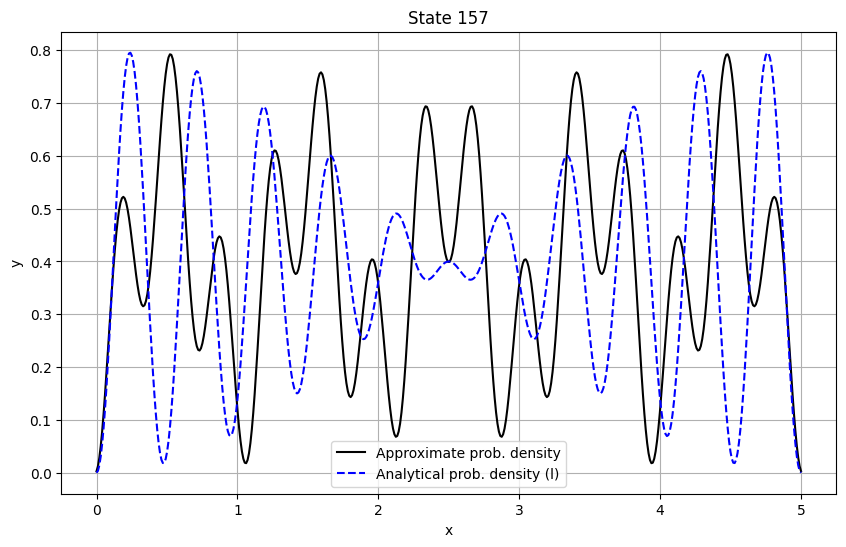

Is approximate close to analytic 1 for state 58?: False
Is approximate close to analytic 2 for state 58?: False


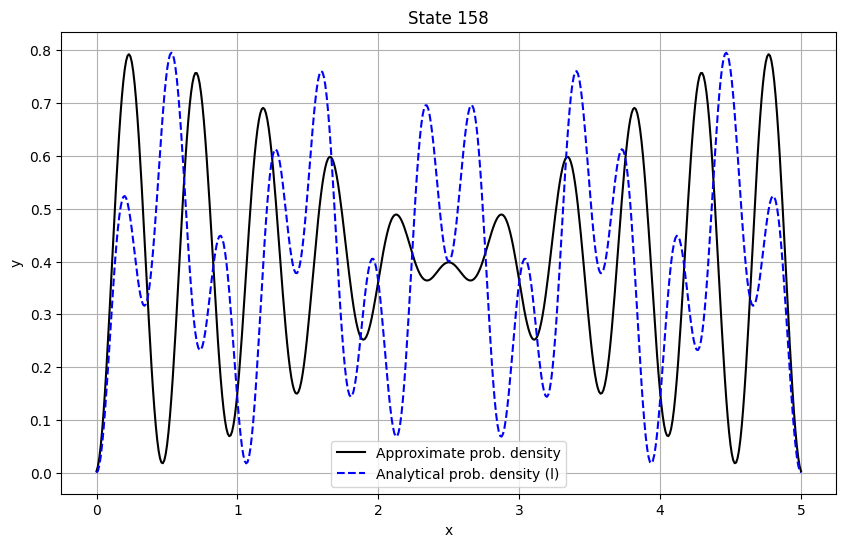

Is approximate close to analytic 1 for state 59?: False
Is approximate close to analytic 2 for state 59?: False


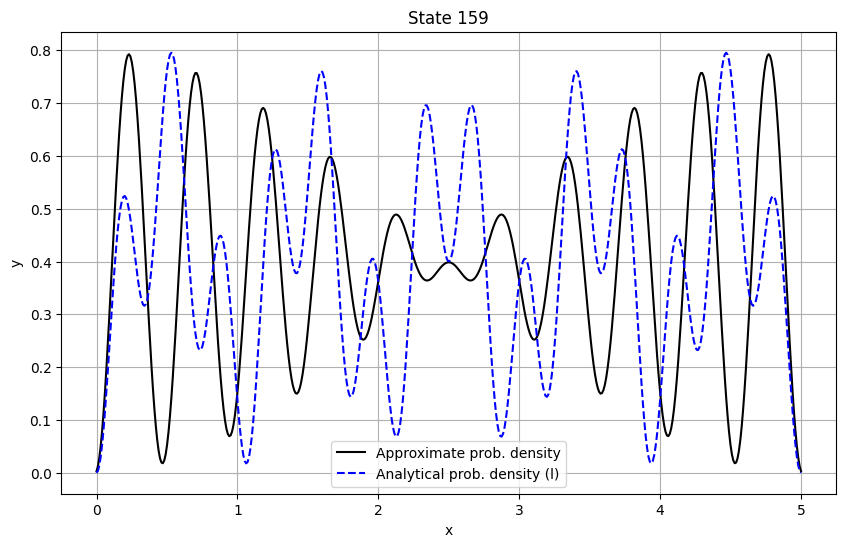

Is approximate close to analytic 1 for state 60?: False
Is approximate close to analytic 2 for state 60?: False


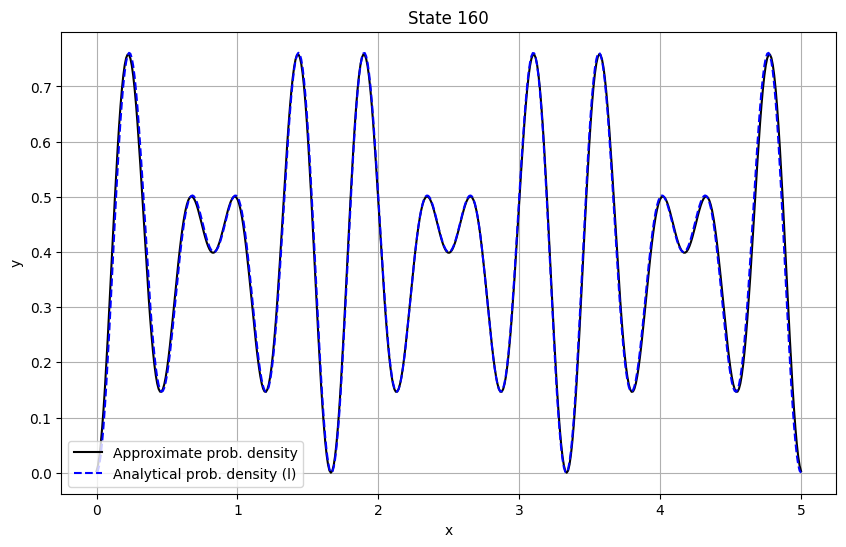

Is approximate close to analytic 1 for state 61?: False
Is approximate close to analytic 2 for state 61?: False


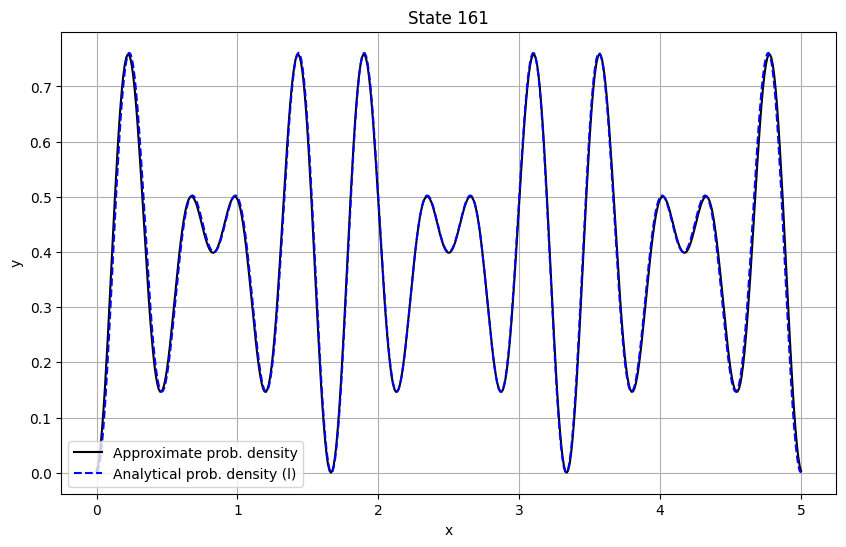

Is approximate close to analytic 1 for state 62?: False
Is approximate close to analytic 2 for state 62?: False


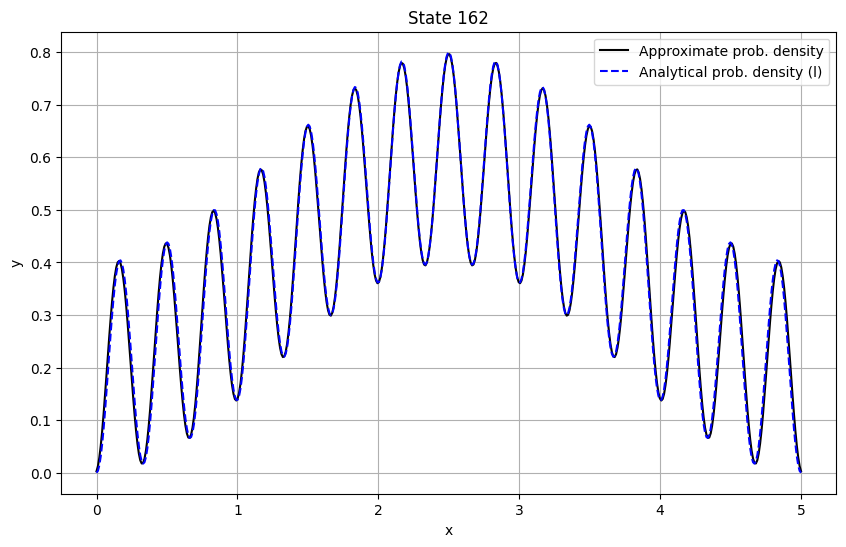

Is approximate close to analytic 1 for state 63?: False
Is approximate close to analytic 2 for state 63?: False


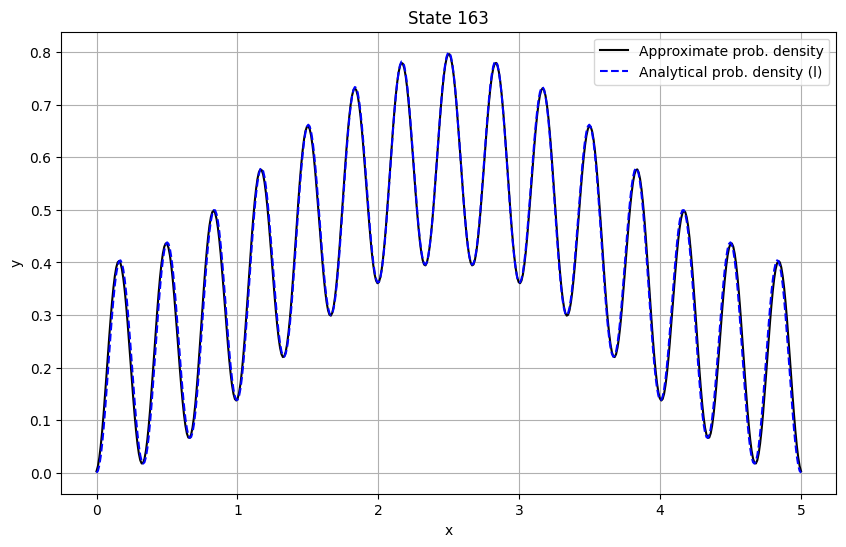

Is approximate close to analytic 1 for state 64?: False
Is approximate close to analytic 2 for state 64?: False


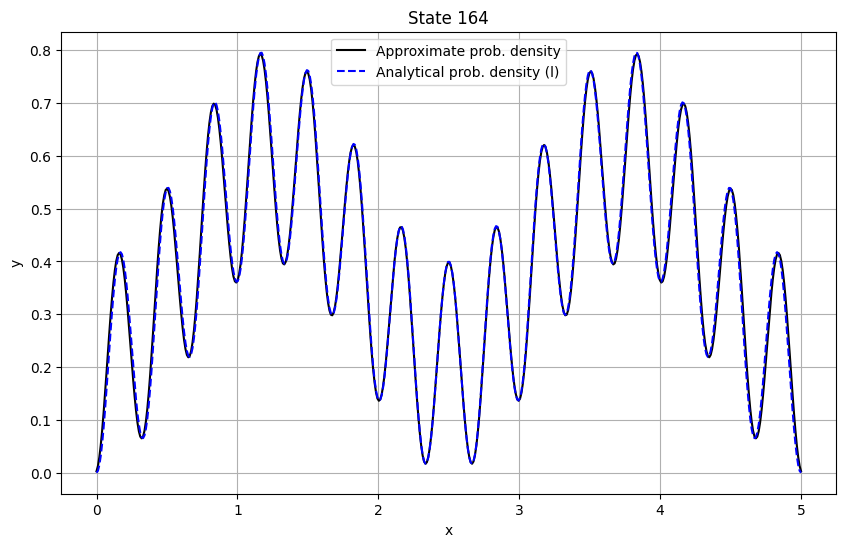

Is approximate close to analytic 1 for state 65?: False
Is approximate close to analytic 2 for state 65?: False


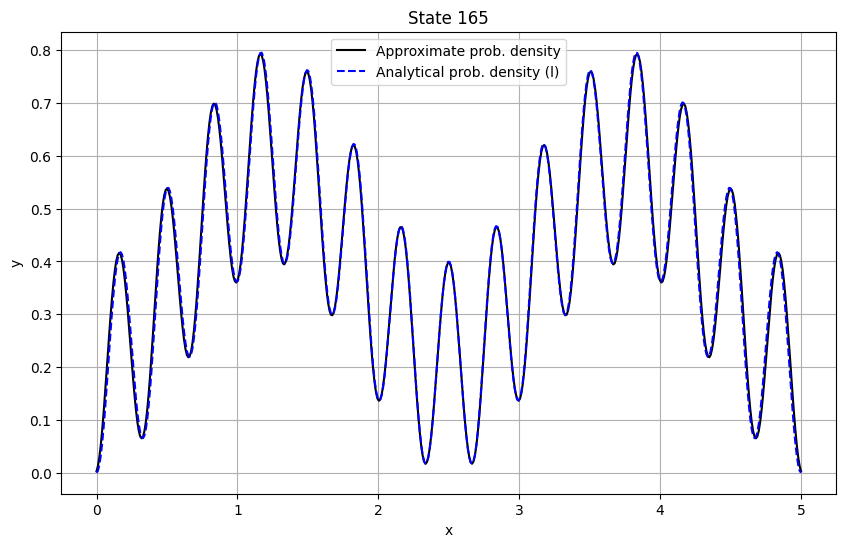

Is approximate close to analytic 1 for state 66?: False
Is approximate close to analytic 2 for state 66?: False


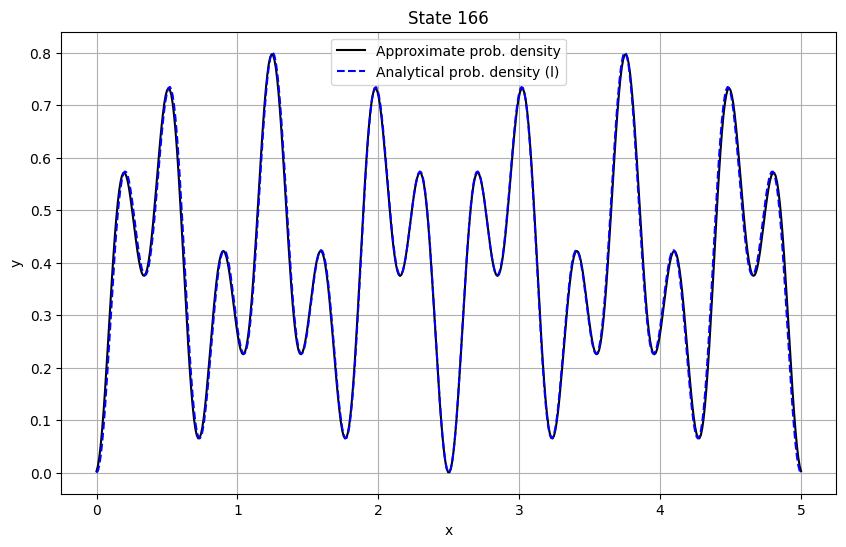

Is approximate close to analytic 1 for state 67?: False
Is approximate close to analytic 2 for state 67?: False


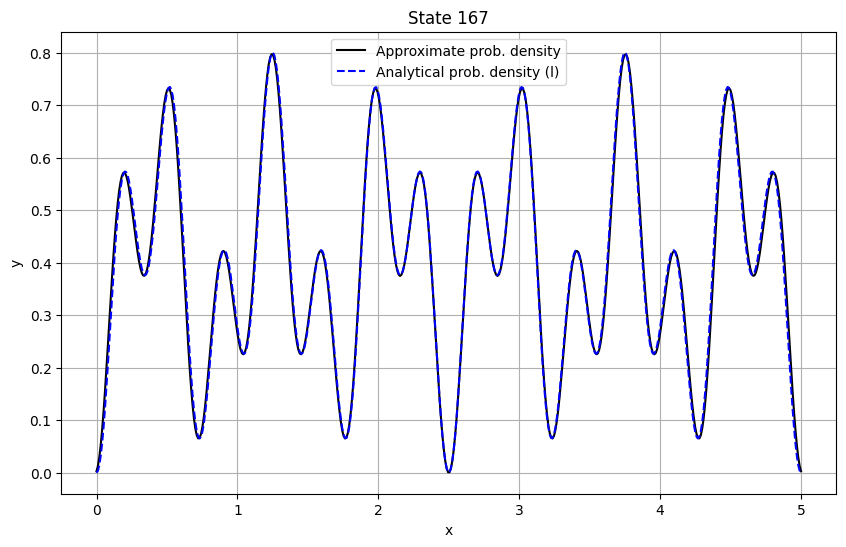

Is approximate close to analytic 1 for state 68?: False
Is approximate close to analytic 2 for state 68?: False


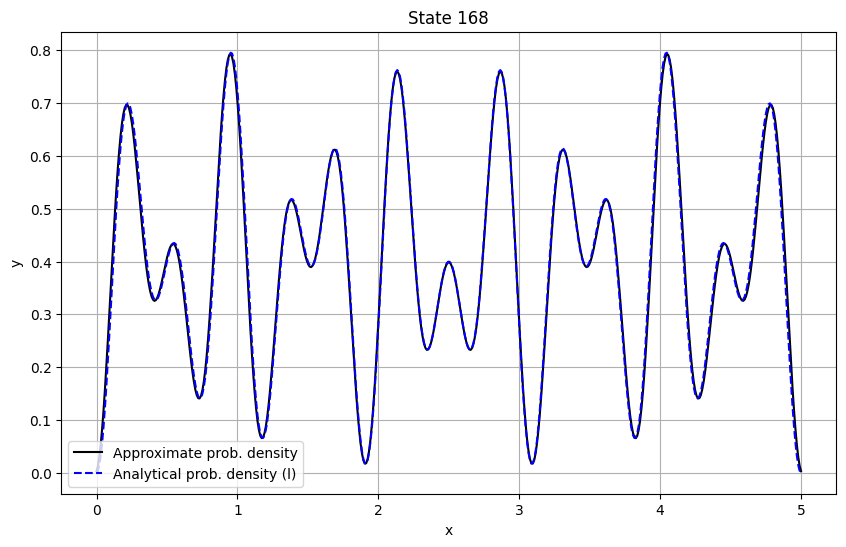

Is approximate close to analytic 1 for state 69?: False
Is approximate close to analytic 2 for state 69?: False


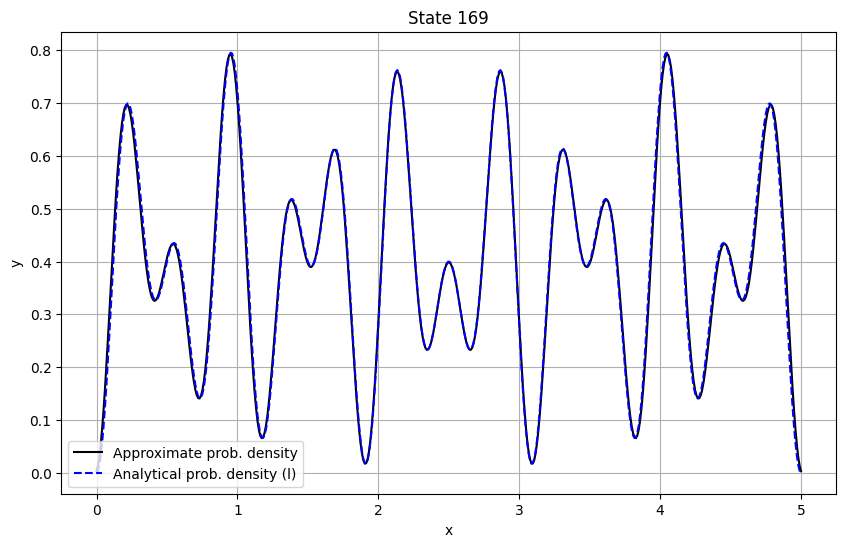

Is approximate close to analytic 1 for state 70?: False
Is approximate close to analytic 2 for state 70?: False


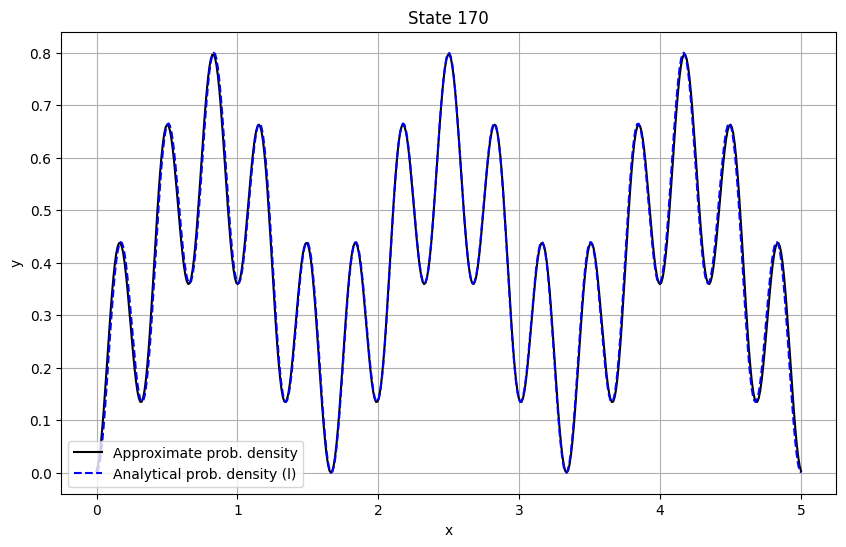

Is approximate close to analytic 1 for state 71?: False
Is approximate close to analytic 2 for state 71?: False


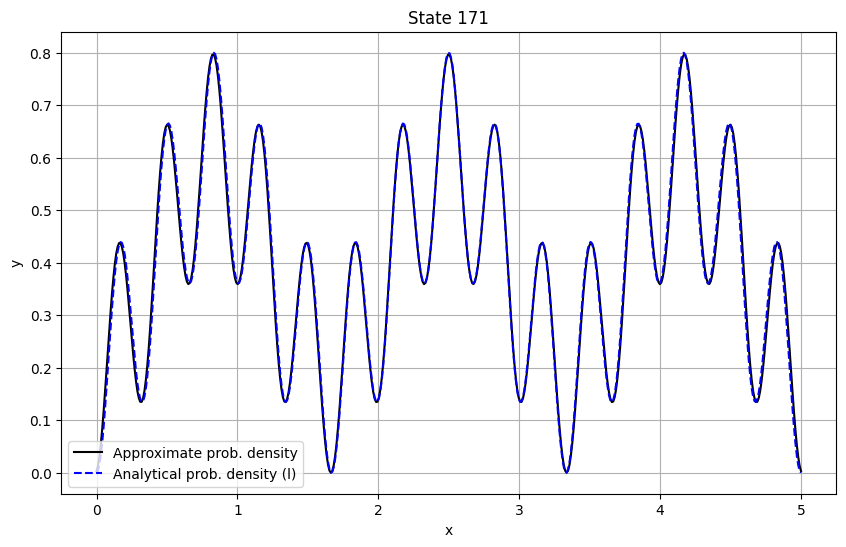

Is approximate close to analytic 1 for state 72?: False
Is approximate close to analytic 2 for state 72?: False


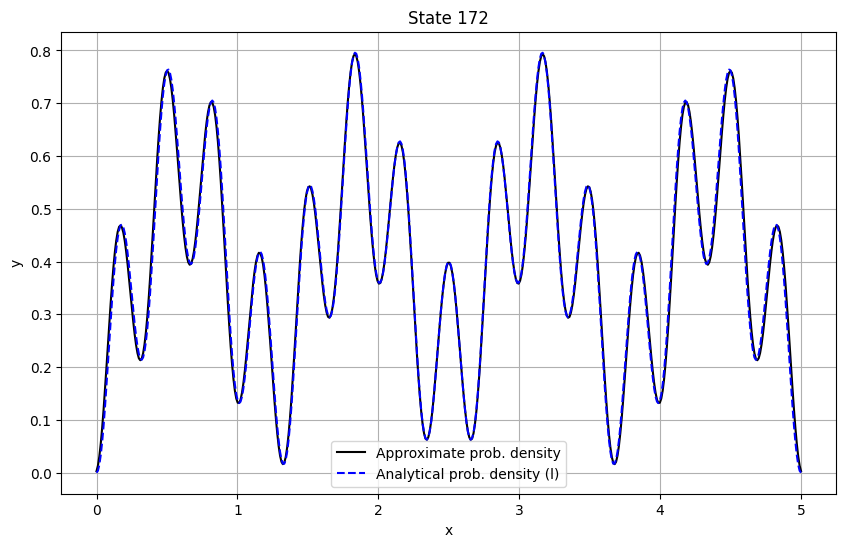

Is approximate close to analytic 1 for state 73?: False
Is approximate close to analytic 2 for state 73?: False


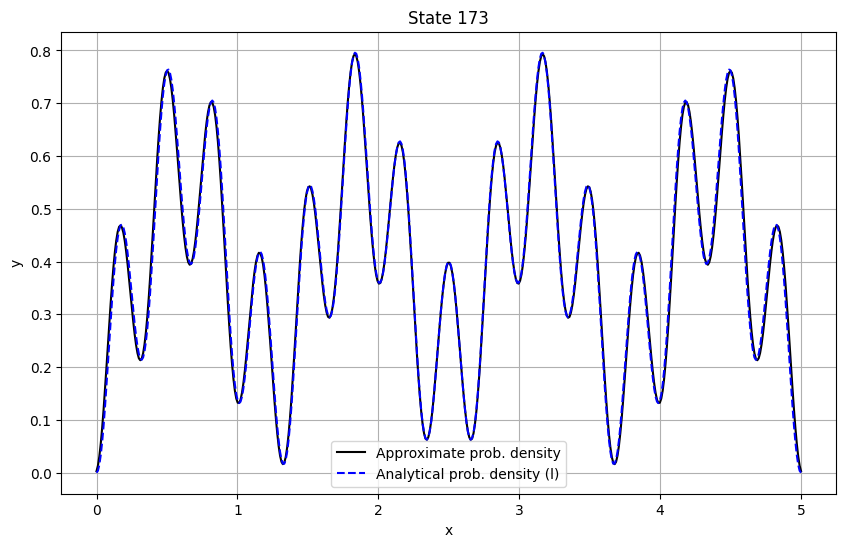

Is approximate close to analytic 1 for state 74?: False
Is approximate close to analytic 2 for state 74?: False


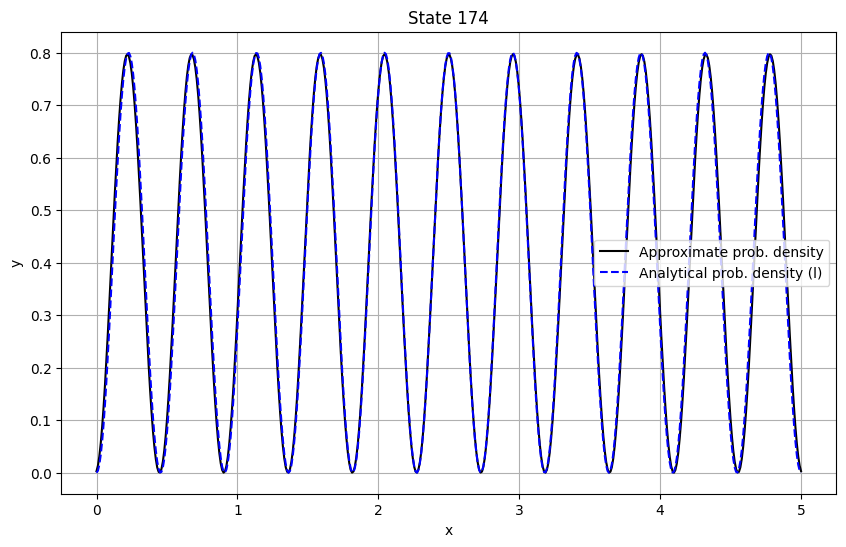

Is approximate close to analytic 1 for state 75?: False
Is approximate close to analytic 2 for state 75?: False


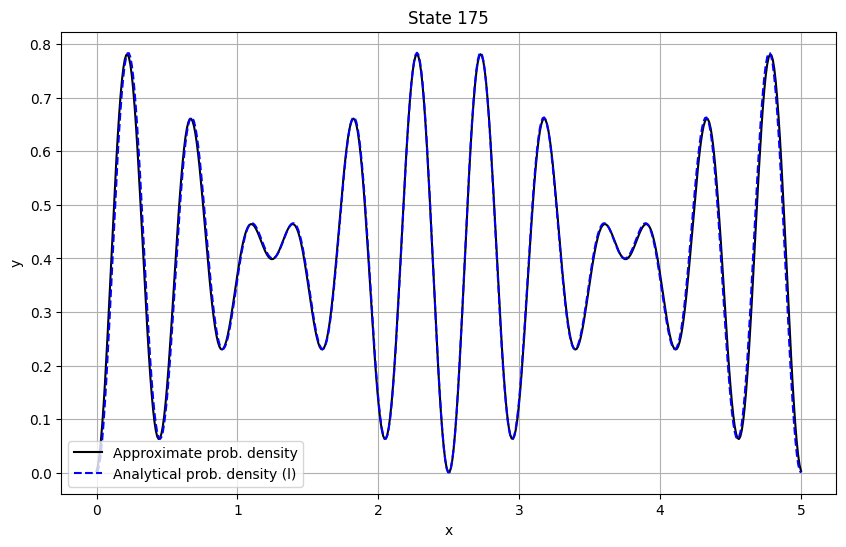

Is approximate close to analytic 1 for state 76?: False
Is approximate close to analytic 2 for state 76?: False


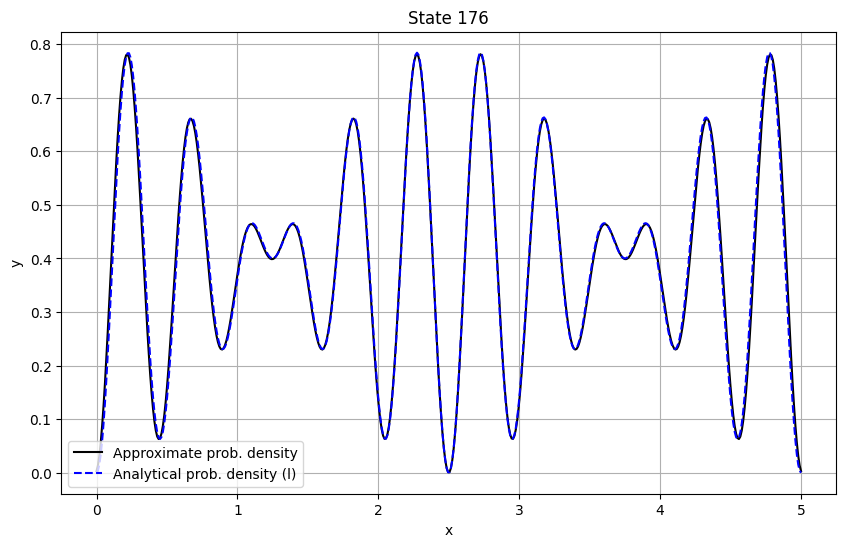

Is approximate close to analytic 1 for state 77?: False
Is approximate close to analytic 2 for state 77?: False


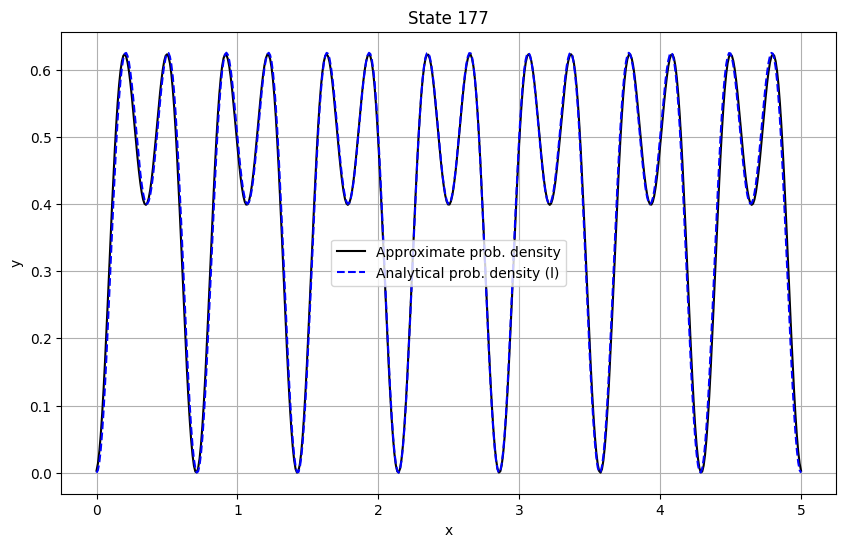

Is approximate close to analytic 1 for state 78?: False
Is approximate close to analytic 2 for state 78?: False


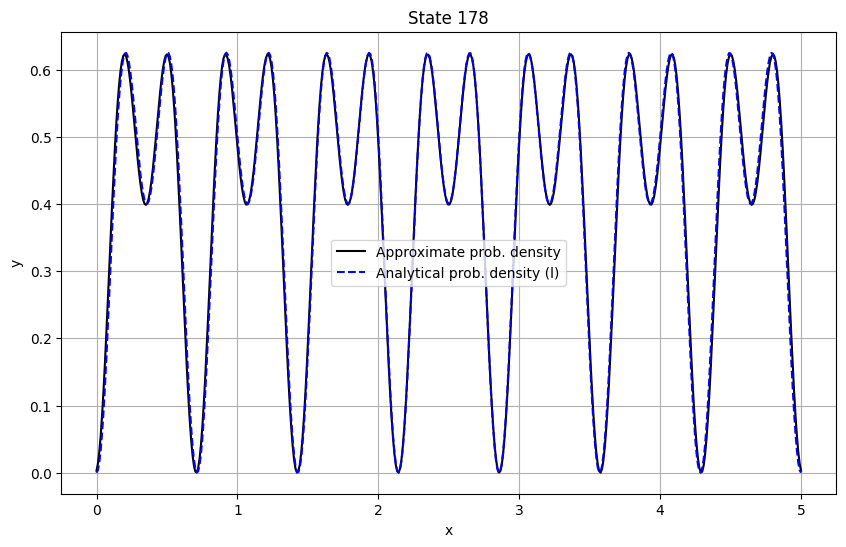

Is approximate close to analytic 1 for state 79?: False
Is approximate close to analytic 2 for state 79?: False


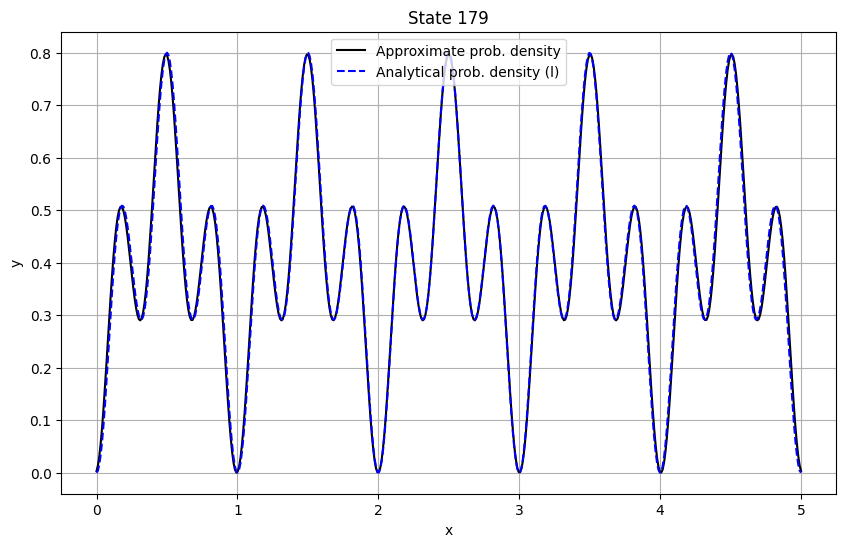

Is approximate close to analytic 1 for state 80?: False
Is approximate close to analytic 2 for state 80?: False


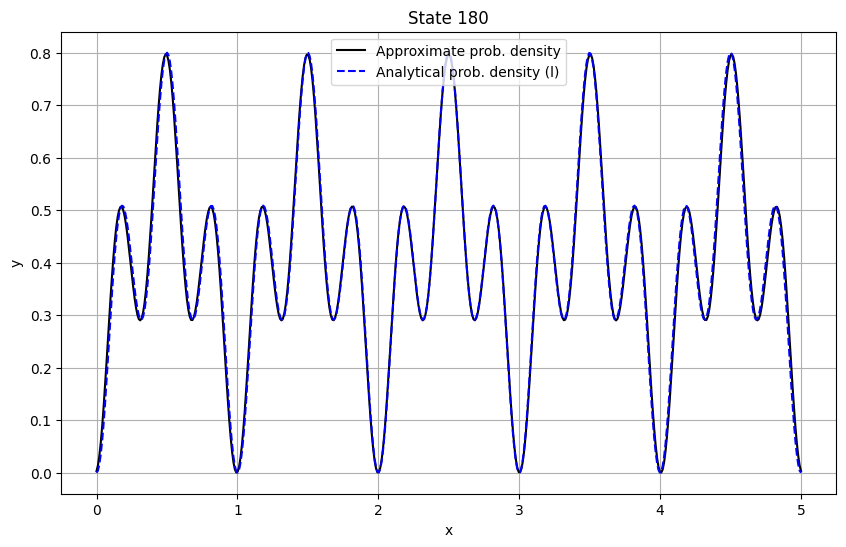

Is approximate close to analytic 1 for state 81?: False
Is approximate close to analytic 2 for state 81?: False


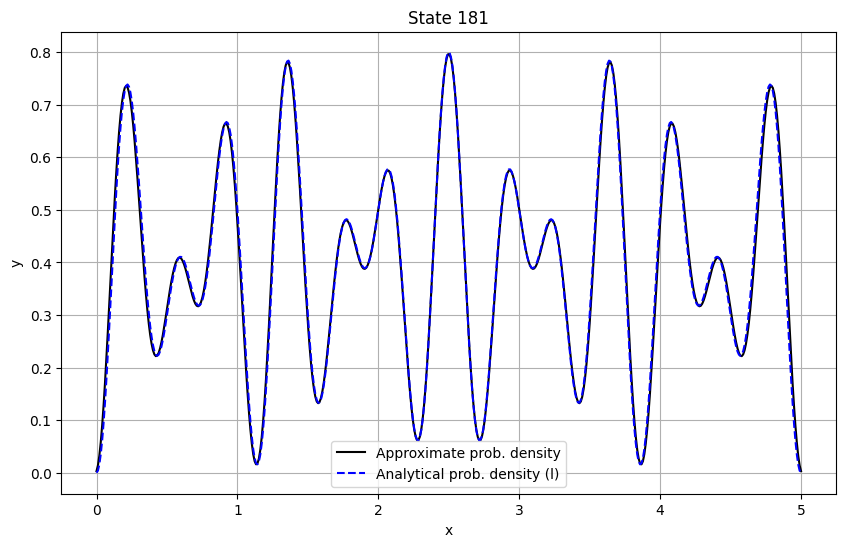

Is approximate close to analytic 1 for state 82?: False
Is approximate close to analytic 2 for state 82?: False


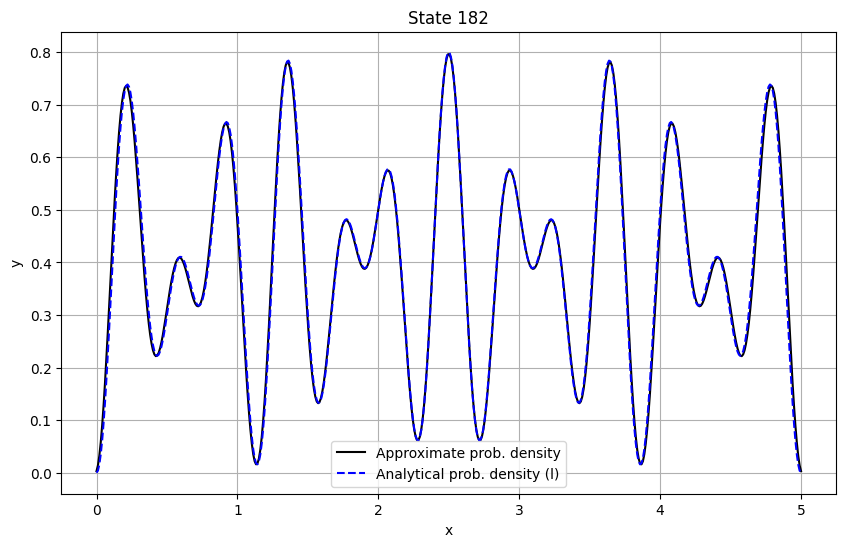

Is approximate close to analytic 1 for state 83?: False
Is approximate close to analytic 2 for state 83?: False


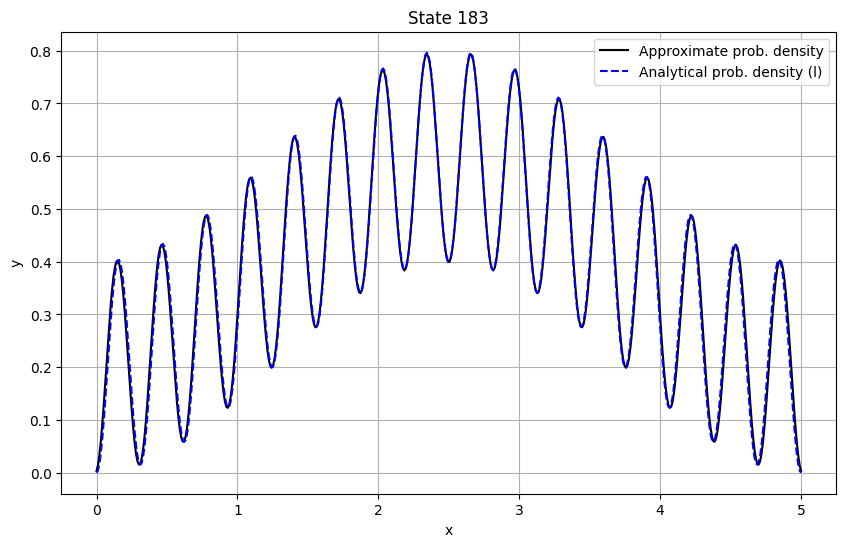

Is approximate close to analytic 1 for state 84?: False
Is approximate close to analytic 2 for state 84?: False


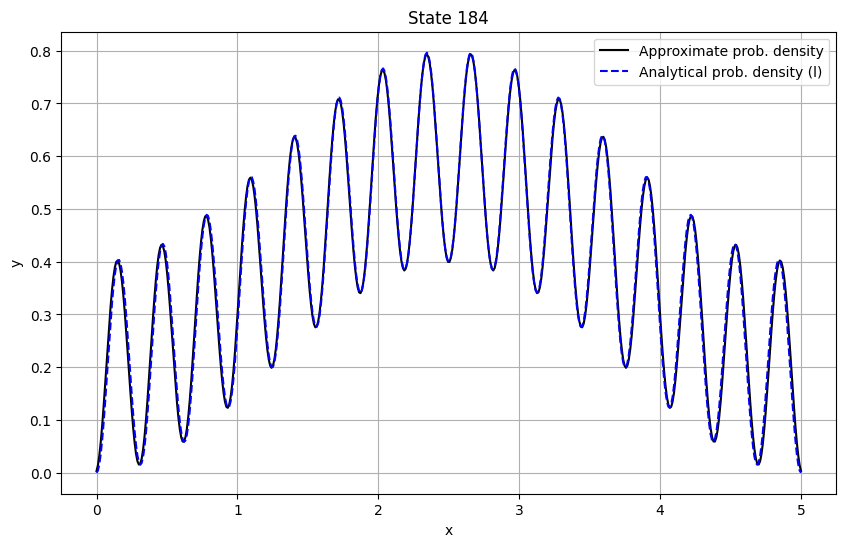

Is approximate close to analytic 1 for state 85?: False
Is approximate close to analytic 2 for state 85?: False


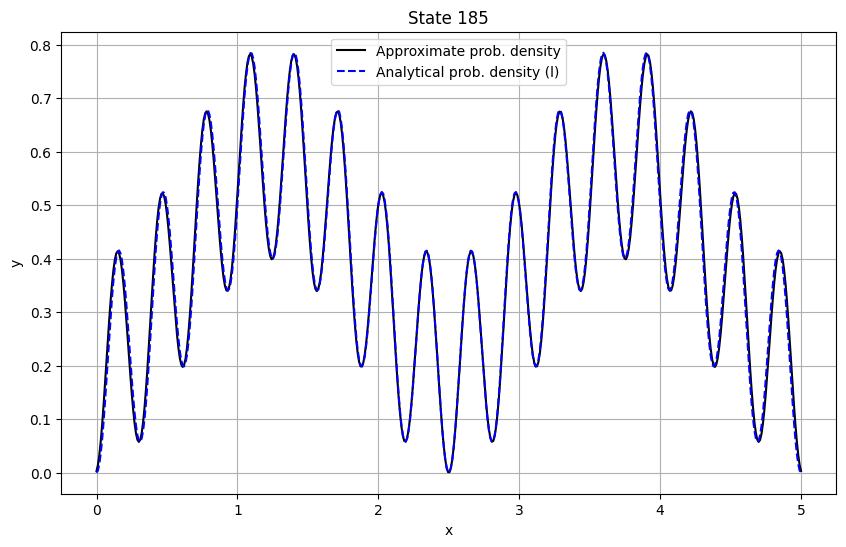

Is approximate close to analytic 1 for state 86?: False
Is approximate close to analytic 2 for state 86?: False


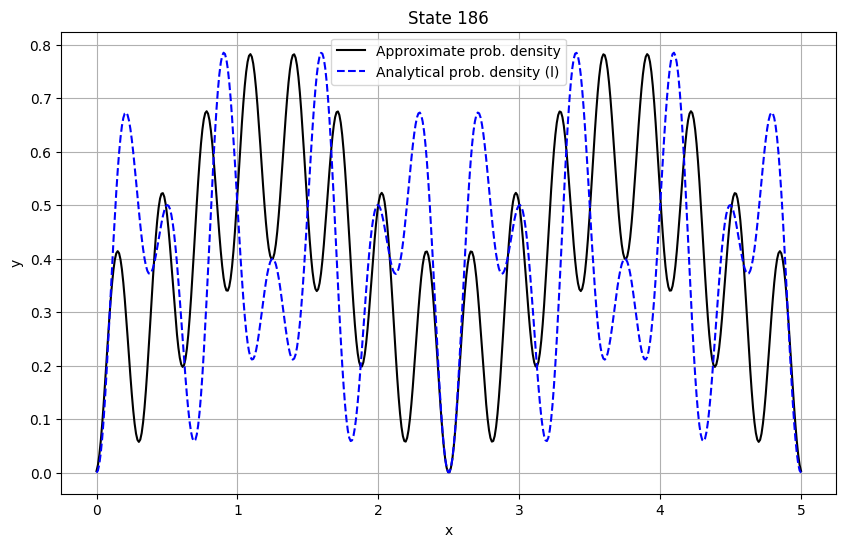

Is approximate close to analytic 1 for state 87?: False
Is approximate close to analytic 2 for state 87?: False


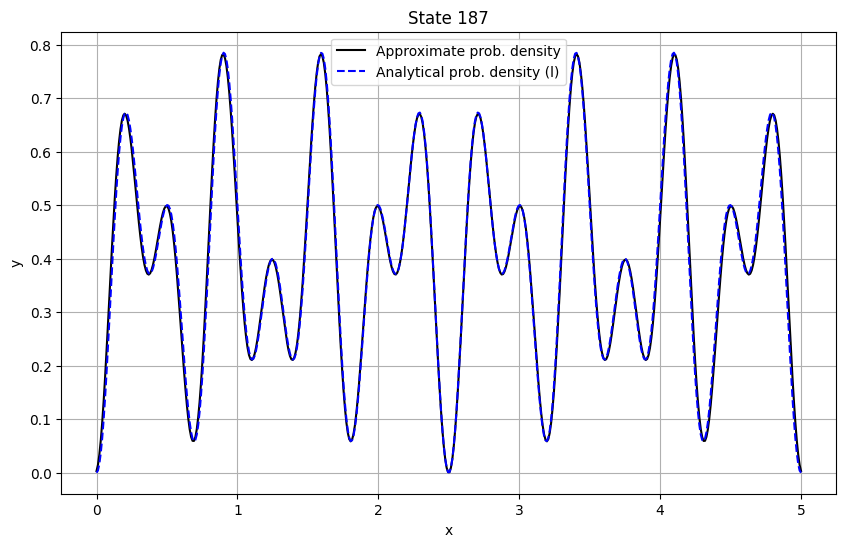

Is approximate close to analytic 1 for state 88?: False
Is approximate close to analytic 2 for state 88?: False


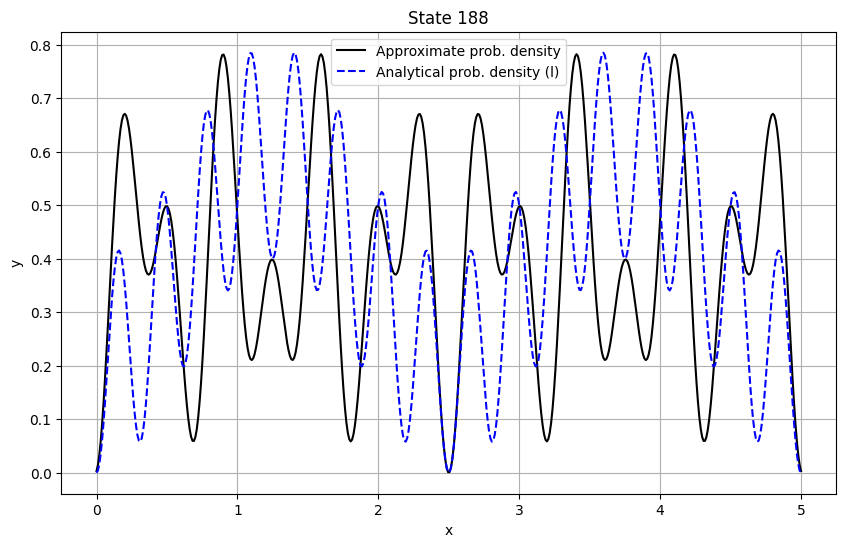

Is approximate close to analytic 1 for state 89?: False
Is approximate close to analytic 2 for state 89?: False


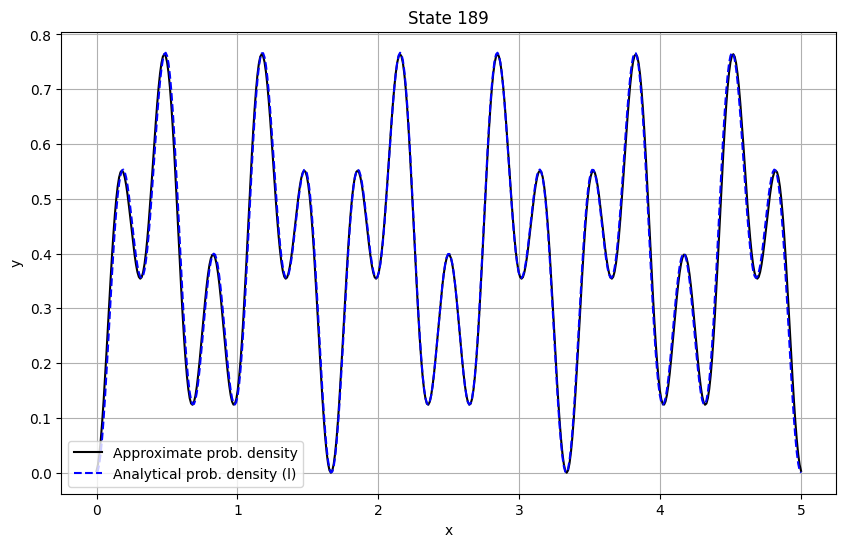

Is approximate close to analytic 1 for state 90?: False
Is approximate close to analytic 2 for state 90?: False


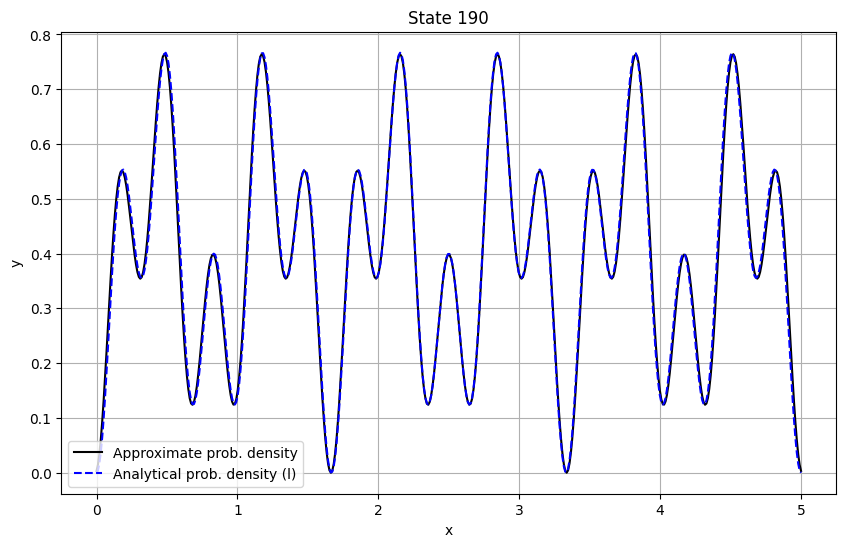

Is approximate close to analytic 1 for state 91?: False
Is approximate close to analytic 2 for state 91?: False


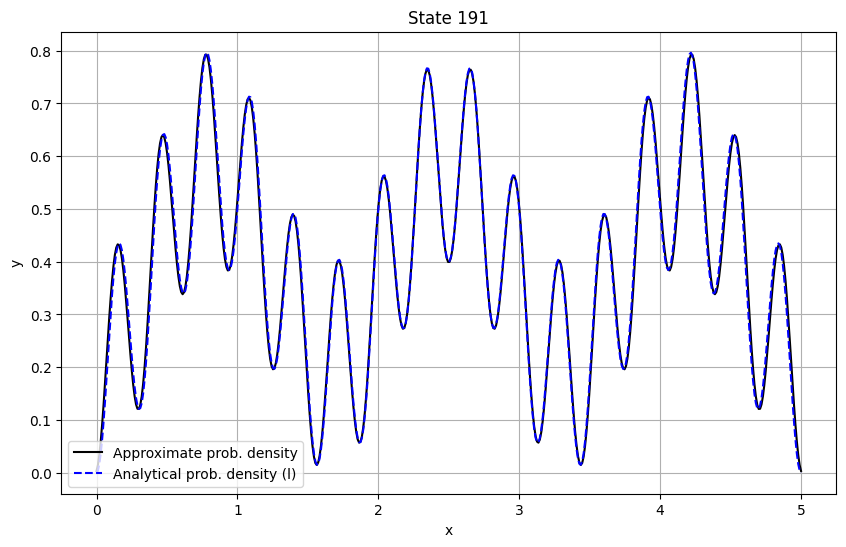

Is approximate close to analytic 1 for state 92?: False
Is approximate close to analytic 2 for state 92?: False


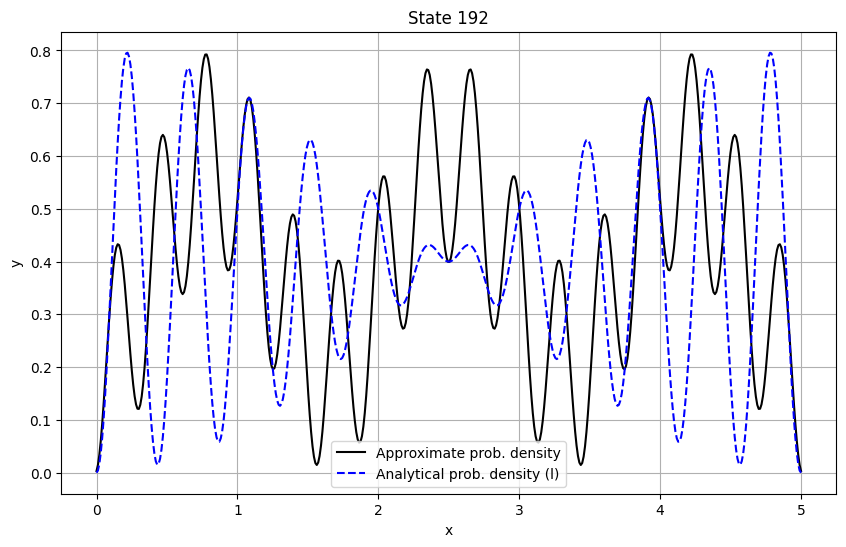

Is approximate close to analytic 1 for state 93?: False
Is approximate close to analytic 2 for state 93?: False


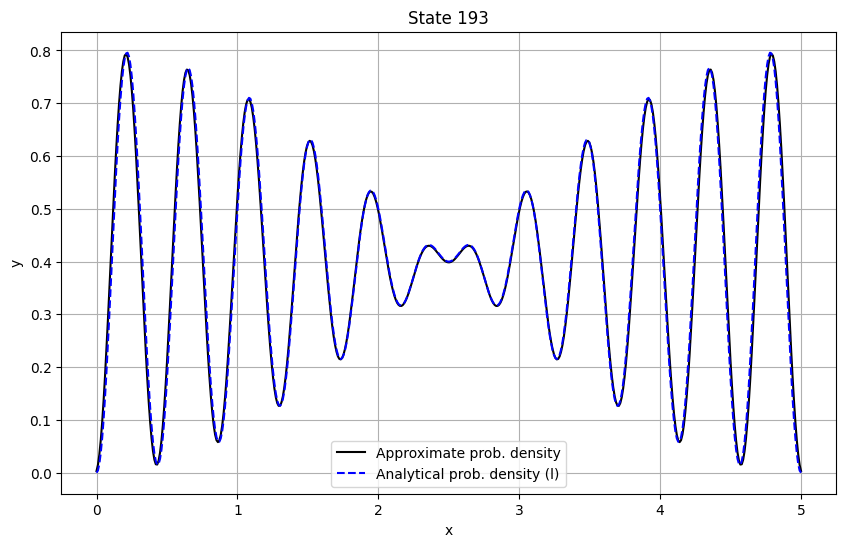

Is approximate close to analytic 1 for state 94?: False
Is approximate close to analytic 2 for state 94?: False


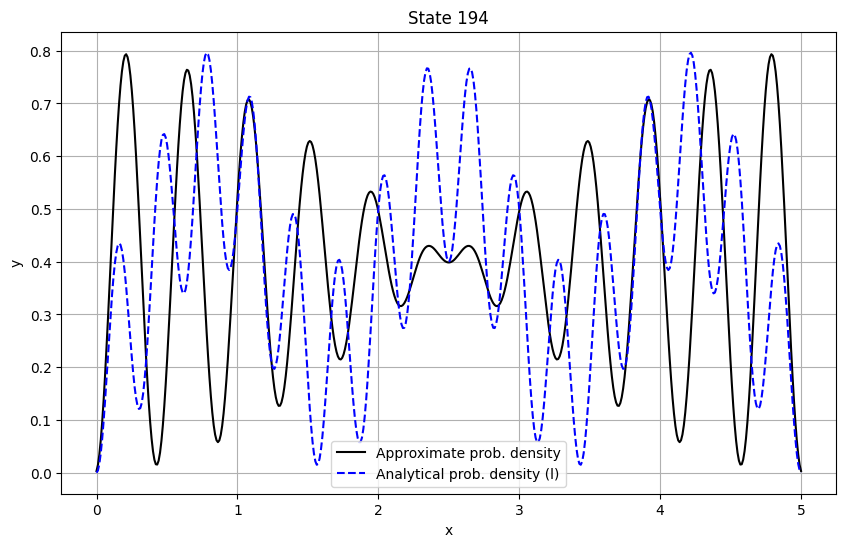

Is approximate close to analytic 1 for state 95?: False
Is approximate close to analytic 2 for state 95?: False


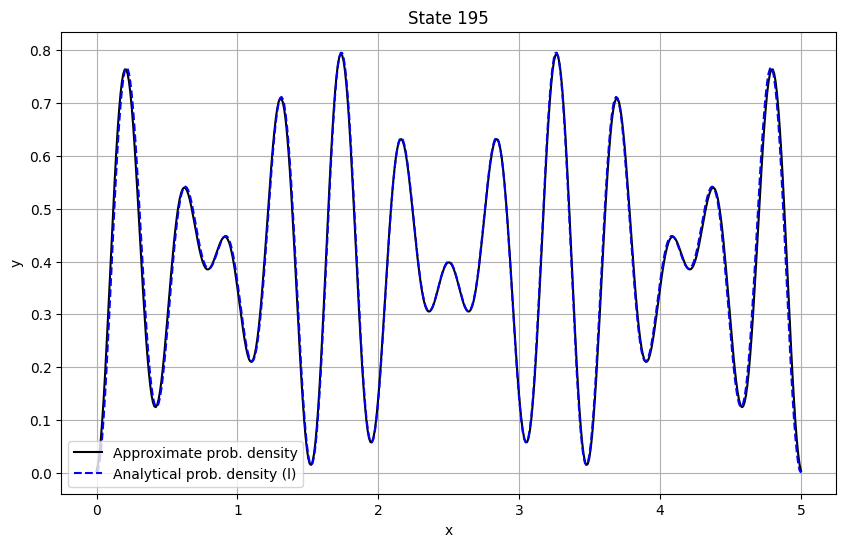

Is approximate close to analytic 1 for state 96?: False
Is approximate close to analytic 2 for state 96?: False


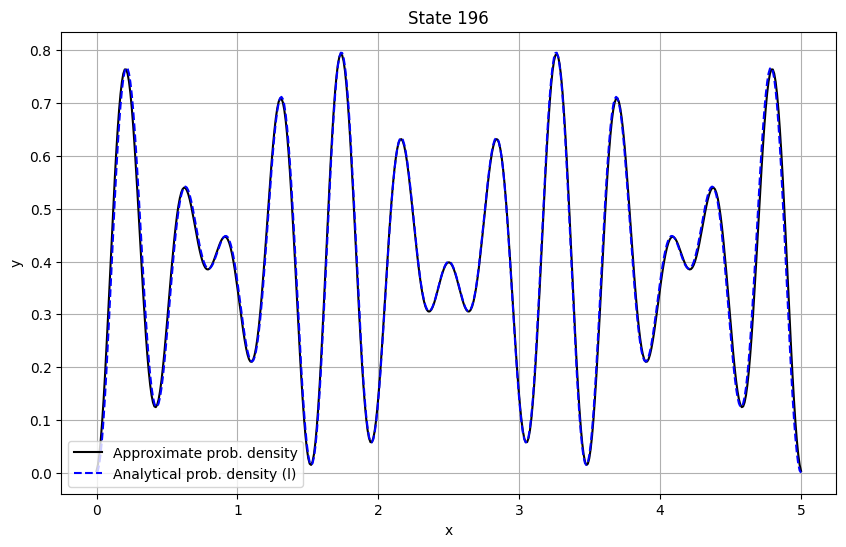

Is approximate close to analytic 1 for state 97?: False
Is approximate close to analytic 2 for state 97?: False


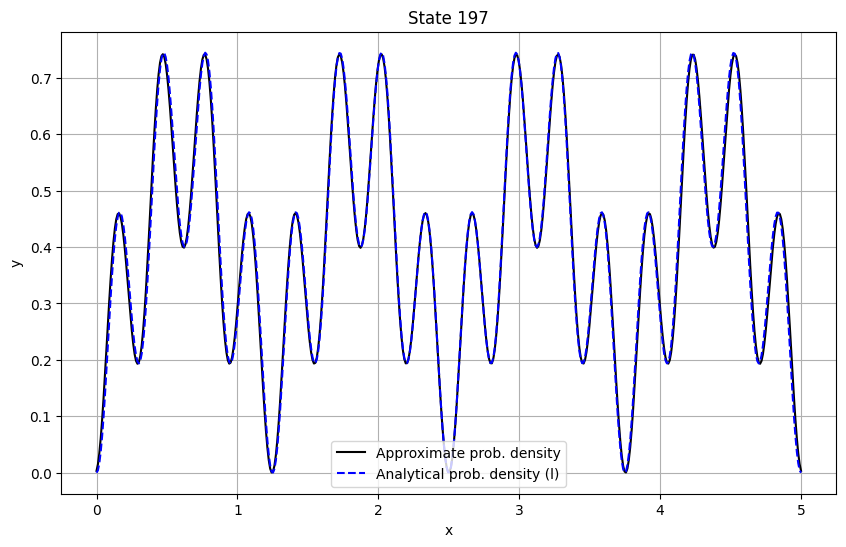

Is approximate close to analytic 1 for state 98?: False
Is approximate close to analytic 2 for state 98?: False


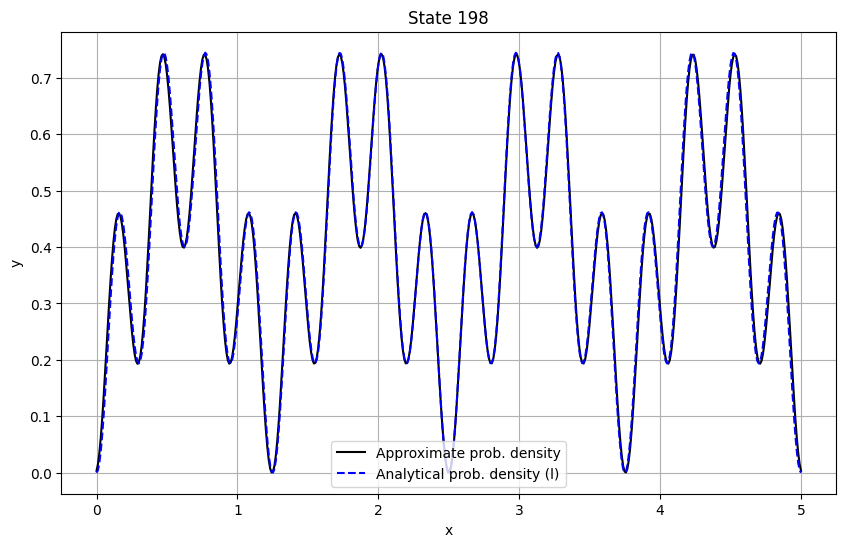

Is approximate close to analytic 1 for state 99?: False
Is approximate close to analytic 2 for state 99?: False


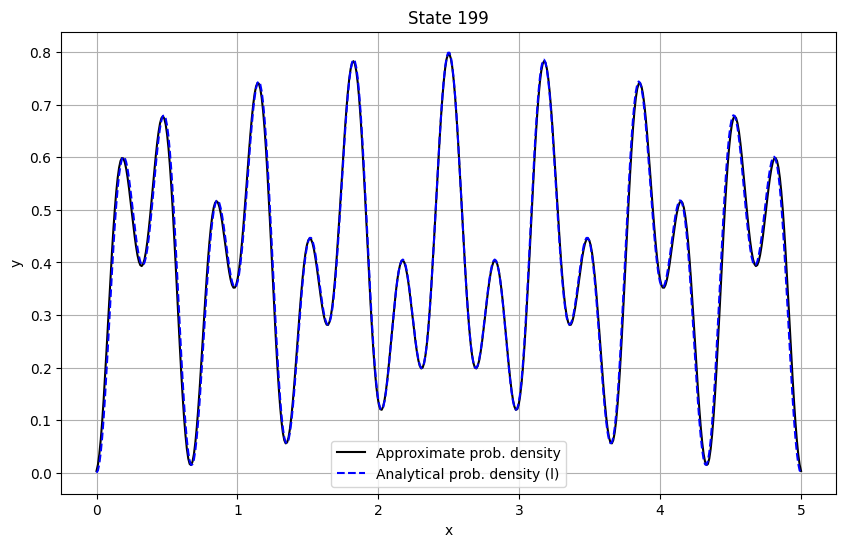

interactive(children=(IntSlider(value=0, description='k:', max=99), Output()), _dom_classes=('widget-interact'…

In [3]:
states_density_comparison(states, pib_double, l, points)